In [1]:
import sqlite3

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import os
import pandas as pd
from numpy.fft import ifftshift,fftshift,fft2,ifft2
from os.path import join, isfile
import pySPM
from math import pi
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from scipy.ndimage import gaussian_filter
from scipy.signal import find_peaks
import matplotlib.transforms as mtransforms
import nanonispy as nap
import time
import datetime

In [14]:
def drop_creat_list_table(database="STMdata.db",table="STMdataLists"):
    database = database
    drop_list_table="DROP TABLE IF EXISTS {}".format(table)
    sql_create_list_table = """ CREATE TABLE IF NOT EXISTS {0} (
                                        List_ID   INTEGER PRIMARY KEY AUTOINCREMENT,
                                        Name TEXT NOT NULL,
                                        TimeStamp REAL,
                                        UpdateFilePath TEXT,
                                        Date TEXT NOT NULL,
                                        Time TEXT NOT NULL,
                                        Bias_V REAL NOT NULL,
                                        Current_pA REAL NOT NULL,
                                        Type TEXT NOT NULL,
                                        PosX_nm  REAL NOT NULL, 
                                        PosY_nm REAL NOT NULL
                                    ) """.format(table)
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        c.execute(drop_list_table)
        c.execute(sql_create_list_table)
def drop_creat_specValue_table(database="STMdata.db",table="STMSpecValue"):
    drop_list_table="DROP TABLE IF EXISTS {}".format(table)
    sql_create_list_table = """ CREATE TABLE IF NOT EXISTS {0} (

                                        Data_ID   INTEGER PRIMARY KEY AUTOINCREMENT,
                                        Info_ID INTEGER,
                                        List_ID INTEGER,
                                        TIME_STAMP  REAL,
                                        Bias_forward   BLOB,
                                        Current_forward   BLOB,
                                        Current_backward   BLOB,
                                        LIY_1_omega_forward   BLOB,
                                        LIY_1_omega_backward   BLOB,
                                        FOREIGN KEY (List_ID) 
                                            REFERENCES STMSpecInfo (List_ID) 
                                                ON DELETE CASCADE 
                                                ON UPDATE NO ACTION
                                                
                                                
                                        FOREIGN KEY (Info_ID) 
                                            REFERENCES STMSpecInfo(Info_ID) 
                                                ON DELETE CASCADE 
                                                ON UPDATE NO ACTION

                                        );
                                     """.format(table)
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        c.execute(drop_list_table)
        c.execute(sql_create_list_table)

def drop_creat_GridValue_table(database="STMdata.db",table="STMGridValue"):
    drop_list_table="DROP TABLE IF EXISTS {}".format(table)
    sql_create_list_table = """ CREATE TABLE IF NOT EXISTS {0} (

                                        Data_ID   INTEGER PRIMARY KEY AUTOINCREMENT,
                                        Info_ID INTEGER,
                                        List_ID INTEGER,
                                        TIME_STAMP  REAL,
                                        Para   BLOB,
                                        Current   BLOB,
                                        Bias   BLOB,
                                        LIX_1_omega   BLOB,
                                        LIY_1_omega   BLOB,
                                        FOREIGN KEY (List_ID) 
                                            REFERENCES STMSpecInfo (List_ID) 
                                                ON DELETE CASCADE 
                                                ON UPDATE NO ACTION
                                                
                                                
                                        FOREIGN KEY (Info_ID) 
                                            REFERENCES STMSpecInfo(Info_ID) 
                                                ON DELETE CASCADE 
                                                ON UPDATE NO ACTION

                                        );
                                     """.format(table)
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        c.execute(drop_list_table)
        c.execute(sql_create_list_table)
###['Grid dim="85 x 85"', 'Grid settings=5.186733E-7;-5.103381E-7;1.000000E-8;1.000000E-8;0.000000E+0', 'Filetype=Linear', 'Sweep Signal="Bias (V)"', 'Fixed parameters="Sweep Start;Sweep End"', 'Experiment parameters="X (m);Y (m);Z (m);Z offset (m);Settling time (s);Integration time (s);Z-Ctrl hold;Final Z (m);Scan:Current (A);Scan:Z (m);Scan:LIX 1 omega (A);Scan:LIY 1 omega (A)"', '# Parameters (4 byte)=14', 'Experiment size (bytes)=6144', 'Points=512', 'Channels="Current (A);LIX 1 omega (A);LIY 1 omega (A)"', 'Delay before measuring (s)=0.000000E+0', 'Experiment="Grid Spectroscopy"', 'Start time="20.11.2022 15:29:00"', 'End time="21.11.2022 08:51:08"', 'User=', 'Comment="SiC\\0Agrid 85"', 'Current>Current (A)=-82.5716E-12', 'Current>Calibration (A/V)=999.99900E-12', 'Current>Offset (A)=0E+0', 'Current>Gain=n/a']
#'Experiment parameters="X (m);Y (m);Z (m);Z offset (m);Settling time (s);Integration time (s);Z-Ctrl hold;Final Z (m);Scan:Current (A);Scan:Z (m);Scan:LIX 1 omega (A);Scan:LIY 1 omega (A)"', 
# Parameters (4 byte)=14', 'Experiment size (bytes)=6144', 'Points=512', 'Channels="Current (A);LIX 1 omega (A);LIY 1 omega (A)"', 'Delay before measuring (s)=0.000000E+0', 
# 'Experiment="Grid Spectroscopy"', 'Start time="20.11.2022 15:29:00"', 'End time="21.11.2022 08:51:08"', 'User=', 'Comment="SiC\\0Agrid 85"', 'Current>Current (A)=-82.5716E-12',
#  'Current>Calibration (A/V)=999.99900E-12', 'Current>Offset (A)=0E+0', 'Current>Gain=n/a']
def drop_creat_GridInfo_table(database="STMdata.db",table="STMGridInfo"):
    drop_list_table="DROP TABLE IF EXISTS {}".format(table)
    sql_create_list_table = """ CREATE TABLE IF NOT EXISTS {0} (
                                        Info_ID INTEGER PRIMARY KEY AUTOINCREMENT,
                                        List_ID INTEGER,
                                        TIME_STAMP  REAL,
                                        Grid_dim TEXT,
                                        Grid_settings TEXT,
                                        Filetype TEXT,
                                        Sweep_Signal TEXT,
                                        Fixed_parameters TEXT,
                                        Experiment_parameters TEXT,
                                        Parameters TEXT,
                                        Experiment_size TEXT,
                                        Points TEXT,
                                        Channels TEXT,
                                        Delay TEXT,
                                        Experiment TEXT,
                                        Start_time TEXT,
                                        End_time TEXT,
                                        User TEXT,
                                        Comment TEXT,
                                        Current TEXT,
                                        Calibration TEXT,
                                        Offset TEXT,
                                        Gain TEXT,
                                        FOREIGN KEY (List_ID) 
                                        REFERENCES STMdataLists (List_ID) 
                                            ON DELETE CASCADE 
                                            ON UPDATE NO ACTION

                                
                                        
                                    ); """.format(table)
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        c.execute(drop_list_table)
        c.execute(sql_create_list_table)
def drop_creat_specInfo_table(database="STMdata.db",table="STMSpecInfo"):
    drop_list_table="DROP TABLE IF EXISTS {}".format(table)
    sql_create_list_table = """ CREATE TABLE IF NOT EXISTS {0} (
                                        Info_ID INTEGER PRIMARY KEY AUTOINCREMENT,
                                        List_ID INTEGER,
                                        TIME_STAMP  REAL,
                                        Date TEXT,
                                        User TEXT,
                                        X_m TEXT,
                                        Y_m TEXT,
                                        Z_m TEXT,
                                        Z_offset TEXT,
                                        Settling_time TEXT,
                                        Integration_time TEXT,
                                        Z_Ctrl_hold TEXT,
                                        Final_Z TEXT,
                                        Filter_type TEXT,
                                        Filter_order TEXT,
                                        Cut_off TEXT,
                                        Comment TEXT,
                                        FOREIGN KEY (List_ID) 
                                        REFERENCES STMdataLists (List_ID) 
                                            ON DELETE CASCADE 
                                            ON UPDATE NO ACTION

                                
                                        
                                    ); """.format(table)
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        c.execute(drop_list_table)
        c.execute(sql_create_list_table)


def drop_creat_imageValue_table(database="STMdata.db",table="STMimageValue"):
    drop_list_table="DROP TABLE IF EXISTS {}".format(table)
    sql_create_list_table = """ CREATE TABLE IF NOT EXISTS {0} (
                                        Data_ID   INTEGER PRIMARY KEY AUTOINCREMENT,
                                        Info_ID INTEGER,
                                        List_ID INTEGER,
                                        TIME_STAMP  REAL,
                                        Z_forward   BLOB,
                                        Z_backward   BLOB,
                                        Current_forward   BLOB,
                                        Current_backward   BLOB,
                                        LIY_1_omega_forward   BLOB,
                                        LIY_1_omega_backward   BLOB,
                                        FOREIGN KEY (List_ID) 
                                            REFERENCES STMimageInfo (List_ID) 
                                                ON DELETE CASCADE 
                                                ON UPDATE NO ACTION
                                                
                                                
                                        FOREIGN KEY (Info_ID) 
                                            REFERENCES STMimageInfo(Info_ID) 
                                                ON DELETE CASCADE 
                                                ON UPDATE NO ACTION

                                        );
                                     """.format(table)
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        c.execute(drop_list_table)
        c.execute(sql_create_list_table)


def creat_table(database="STMdataLite.db"):
    drop_creat_list_table(database=database,table="STMdataLists")
    drop_creat_imageInfo_table(database=database,table="STMimageInfo")
    drop_creat_imageValue_table(database=database,table="STMimageValue")
    drop_creat_specInfo_table(database=database,table="STMSpecInfo")
    drop_creat_specValue_table(database=database,table="STMSpecValue")
    drop_creat_GridInfo_table(database=database,table="STMGridInfo")
    drop_creat_GridValue_table(database=database,table="STMGridValue")

def drop_creat_imageInfo_table(database="STMdata.db",table="STMimageInfo"):
    drop_info_table="DROP TABLE IF EXISTS {}".format(table)
    sql_create_info_table = """ 
                                CREATE TABLE {}(
                                Info_ID INTEGER PRIMARY KEY AUTOINCREMENT,
                                List_ID INTEGER,
                                TIME_STAMP  REAL,
                                NANONIS_VERSION TEXT,
                                SCANIT_TYPE TEXT,
                                REC_DATE TEXT,
                                REC_TIME TEXT,
                                REC_TEMP TEXT,
                                ACQ_TIME TEXT,
                                SCAN_PIXELS TEXT,
                                SCAN_FILE TEXT,
                                SCAN_TIME TEXT,
                                SCAN_RANGE TEXT,
                                SCAN_OFFSET TEXT,
                                SCAN_ANGLE TEXT,
                                SCAN_DIR TEXT,
                                BIAS TEXT,
                                Z_CONTROLLER TEXT,
                                COMMENT TEXT,
                                Session_Path TEXT,
                                SW_Version TEXT,
                                UI_Release TEXT,
                                RT_Release TEXT,
                                RT_Frequency TEXT,
                                Signals_Oversampling TEXT,
                                Animations_Period TEXT,
                                Indicators_Period TEXT,
                                Measurements_Period  TEXT,
                                DATA_INFO TEXT, 
                                FOREIGN KEY (List_ID) 
                                    REFERENCES STMdataLists (List_ID) 
                                        ON DELETE CASCADE 
                                        ON UPDATE NO ACTION

                                ); """.format(table)
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        c.execute(drop_info_table)
        print(sql_create_info_table)
        c.execute(sql_create_info_table)
def insert_list_table(database="STMdata.db",table="STMdataLists",STMdate={"Name":"SiC001","TimeStamp":20.0,"UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}):
    key=",".join(STMdate.keys())
    value=",".join(["?"]*len(STMdate))
    insert="INSERT INTO {}({}) VALUES({})".format(table,key,value)
    
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        c.execute(insert,tuple(STMdate.values()))
def fect_data_list_table(database="STMdata.db",table="STMdataLists"):
    fect_sql="SELECT * FROM {}".format(table)
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        data=c.execute(fect_sql)
        value=data.fetchall()
        print(value)
def insert_image_info_table(database="STMdata.db",table="STMimageInfo",STMdate= {"List_ID":1,"TIME_STAMP":100,"NANONIS_VERSION":"SiC001","REC_DATE":"","REC_TIME":"","REC_TEMP":290,"ACQ_TIME":20.0,"SCAN_PIXELS":512,"SCAN_FILE":"","SCAN_TIME":30.0,"SCAN_RANGE":20,"SCAN_OFFSET":"","SCAN_ANGLE":10.0,"SCAN_DIR":'up',"Time":'09:09:29',"BIAS": 2.5,"Z_CONTROLLER": "","COMMENT":"SXM","Session_Path":"","SW_Version":"","UI_Release":"","RT_Release":"","RT_Frequency":"","Signals_Oversampling":"","Animations_Period":"","Indicators_Period":"","Measurements_Period":"","DATA_INFO":""}
):
    key=",".join(STMdate.keys())
    value=",".join(["?"]*len(STMdate))
    insert="INSERT INTO {}({}) VALUES({})".format(table,key,value)
    
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        c.execute(insert,tuple(STMdate.values()))
def insert_Grid_info_table(database,table,STMdate):
    key=",".join(STMdate.keys())
    value=",".join(["?"]*len(STMdate))
    insert="INSERT INTO {}({}) VALUES({})".format(table,key,value)
    
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        c.execute(insert,tuple(STMdate.values()))

def insert_Spec_info_table(database="STMdata.db",table="STMimageInfo",STMdate={"List_ID":1,"TIME_STAMP":2.0,"Date":"11.08.2022 12:15:27","User":"NaN","X_m":"91.6774E-9","Y_m":"91.6774E-9","Z_m":"91.6774E-9","Z_offset":"0","Settling_time":"4E-3","Integration_time":"8E-3","Z_Ctrl_hold":"TRUE","Final_Z":"-211.889E-9","Filter_type":"Gaussian","Order":"3","Cut_off":"","comment":""}):
    key=",".join(STMdate.keys())
    value=",".join(["?"]*len(STMdate))
    insert="INSERT INTO {}({}) VALUES({})".format(table,key,value)
    
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        c.execute(insert,tuple(STMdate.values()))

def fect_data_image_info_table(database="STMdata.db",table="STMimageInfo"):
    fect_sql="SELECT * FROM {}".format(table)
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        data=c.execute(fect_sql)
        value=data.fetchall()
        print(value)


In [5]:
creat_table(database="STMdata.db")

 
                                CREATE TABLE STMimageInfo(
                                Info_ID INTEGER PRIMARY KEY AUTOINCREMENT,
                                List_ID INTEGER,
                                TIME_STAMP  REAL,
                                NANONIS_VERSION TEXT,
                                SCANIT_TYPE TEXT,
                                REC_DATE TEXT,
                                REC_TIME TEXT,
                                REC_TEMP TEXT,
                                ACQ_TIME TEXT,
                                SCAN_PIXELS TEXT,
                                SCAN_FILE TEXT,
                                SCAN_TIME TEXT,
                                SCAN_RANGE TEXT,
                                SCAN_OFFSET TEXT,
                                SCAN_ANGLE TEXT,
                                SCAN_DIR TEXT,
                                BIAS TEXT,
                                Z_CONTROLLER TEXT,
                                COMMEN

In [9]:
creat_table(database="../../STMdataLite.db")

 
                                CREATE TABLE STMimageInfo(
                                Info_ID INTEGER PRIMARY KEY AUTOINCREMENT,
                                List_ID INTEGER,
                                TIME_STAMP  REAL,
                                NANONIS_VERSION TEXT,
                                SCANIT_TYPE TEXT,
                                REC_DATE TEXT,
                                REC_TIME TEXT,
                                REC_TEMP TEXT,
                                ACQ_TIME TEXT,
                                SCAN_PIXELS TEXT,
                                SCAN_FILE TEXT,
                                SCAN_TIME TEXT,
                                SCAN_RANGE TEXT,
                                SCAN_OFFSET TEXT,
                                SCAN_ANGLE TEXT,
                                SCAN_DIR TEXT,
                                BIAS TEXT,
                                Z_CONTROLLER TEXT,
                                COMMEN

In [15]:
        
def string_to_timestamp(date_string, format_string='%Y-%m-%d %H:%M:%S'):
    try:
        # Parse the date string into a datetime object
        date_obj = datetime.datetime.strptime(date_string, format_string)

        # Convert the datetime object to a timestamp
        timestamp = date_obj.timestamp()
        return timestamp
    except ValueError as e:
        print(f"Error: {e}")
        return None
def format_image_List(myfile,STMdate={"Name":"SiC001","TimeStamp":20.0,"UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}):
    format_string='%d.%m.%Y %H:%M:%S'
    SXMfile=pySPM.SXM(myfile)
    header=SXMfile.header
    [x_n,y_n]=header['SCAN_RANGE'][0]
    Bias=header['BIAS'][0][0]
    Curr=header['Z-CONTROLLER'][1][3]
    Pos=header['SCAN_OFFSET'][0]
    FilePath=header['SCAN_FILE'][0][0]+header['SCAN_FILE'][0][1]
    REC_Data=header['REC_DATE'][0][0]
    REC_Time=header['REC_TIME'][0][0]
    file=[f for f in FilePath.split(".")]
    filetype=file[1]
    fileData=[f for f in file[0].split("\\")]
    fileName=fileData[-1]
    date_time_s=REC_Data+" "+REC_Time
    timestamp = string_to_timestamp(date_time_s,format_string)
    STMdate["Name"]=fileName
    STMdate["TimeStamp"]=timestamp
    STMdate["UpdateFilePath"]=myfile
    STMdate["Date"]=REC_Data
    STMdate["Time"]=REC_Time
    STMdate["Bias_V"]=round(float(Bias),2)
    STMdate["Current_pA"]=round(float(Curr)*1e12,1)
    STMdate["Type"]=filetype
    STMdate["PosX_nm"]=round(float(Pos[0])*1e9,3)
    STMdate["PosY_nm"]=round(float(Pos[1])*1e9,3)
    return STMdate
def format_spec_List(myfile,STMdate={"Name":"SiC001","TimeStamp":20.0,"UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}):
    format_string='%d.%m.%Y %H:%M:%S'            
    filePath=myfile
    Notfound=1
    skiprows=13
    while Notfound:
        df_h=pd.read_csv(filePath,sep="\t",nrows=skiprows)

        dic_key=df_h[df_h.keys()]["Experiment"][skiprows-1]

        if dic_key!= "[DATA]":
            Notfound=1
            skiprows+=1
        else:
            Notfound=0
            df_h=pd.read_csv(filePath,sep="\t",nrows=skiprows)

    file=[f for f in filePath.split(".")]
    filetype=file[-1]
    fileName=[f for f in file[-2].split("\\")][-1]
    STMdate["Name"]=fileName
    STMdate["UpdateFilePath"]=myfile
    x=df_h["bias spectroscopy"][2]
    y=df_h["bias spectroscopy"][3]
    z=df_h["bias spectroscopy"][4]
    date=df_h["bias spectroscopy"][0]
    [d,t]=[d for d in date.split(" ")]
    date_time_s=d+" "+t
    timestamp = string_to_timestamp(date_time_s,format_string)
    STMdate["Date"]=d
    STMdate["Time"]=t
    STMdate["TimeStamp"]=timestamp
    STMdate["Type"]=filetype
    STMdate["PosX_nm"]=round(float(x)*1e9,3)
    STMdate["PosY_nm"]=round(float(y)*1e9,3)
    Notfound=1
    skiprows=20
    while Notfound:
        df_d=pd.read_table(filePath,sep="\t",skiprows=skiprows)
        Keys=df_d.keys()
        if Keys[0]!= "Bias calc (V)":
            Notfound=1
            skiprows-=1
        else:
            df_d=pd.read_table(filePath,sep="\t",skiprows=skiprows)
            Keys=df_d.keys()
            Notfound=0
            I=df_d[Keys[1]]
            X=np.array(df_d[Keys[0]])        
            Bias=X[0]
            Curr=I[0]
            STMdate["Bias_V"]=round(float(Bias),2)
            STMdate["Current_pA"]=round(float(Curr)*1e12,1)
    return STMdate
def update_all_name_list(mydir="..\\..\\STMdata",database="STMdata.db",table="STMdataLists"):
    myFiledirs=[join(mydir,Fold) for Fold in os.listdir(mydir)]
    myFiledirs.sort(key=os.path.getmtime)
    for mydir in myFiledirs[:-1]:
        myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
        myfiles.sort(key=os.path.getmtime)
        write_database_namelist(myfiles,database=database,table=table)

def format_Grid_List(myfile,STMdate={"Name":"SiC001","TimeStamp":20.0,"UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}):
    format_string='%d.%m.%Y %H:%M:%S'
    filePath=myfile
    file=[f for f in filePath.split(".")]
    filetype=file[-1]
    
    fileName=[f for f in file[-2].split("\\")][-1]
    STMdate["Name"]=fileName
    try:
        grid = nap.read.Grid(filePath) 
        sweep=grid._derive_sweep_signal()
        dic_keys = grid._load_data().keys()
        list_data=list(grid._load_data())
        params=grid._load_data()['params']
        head = grid.read_raw_header(byte_offset=745)
        df=pd.DataFrame([x.split(",") for x in head.split("\r\n")])
        Res=[j for j in df[0][0].split("=")]
        Set=[j for j in df[0][1].split(";")]
        Point=[j for j in df[0][8].split("=")]
        Date=[j for j in df[0][12].split("=")]
        DateTime=[j for j in Date[1].split(" ")]
        Recdate=DateTime[0][1:]
        Rectime=DateTime[1][:-1]
        Resxy=[j for j in Res[1].split("x")]
        xpoints=[j for j in Set[0].split("=")]

        Resoltion=[float(Resxy[0][1:]),float(Resxy[1][:-1]),float(Point[1])]
        position=[float(xpoints[1]),float(Set[1])]
        size=[float(Set[2]),float(Set[3])]
        date_time_s=Recdate+" "+Rectime
        timestamp = string_to_timestamp(date_time_s,format_string)
        STMdate["TimeStamp"]=timestamp
        STMdate["UpdateFilePath"]=myfile
        STMdate["Date"]=Recdate
        STMdate["Time"]=Rectime
        STMdate["Bias_V"]=round(float(0),2)
        STMdate["Current_pA"]=round(float(0)*1e12,1)
        STMdate["Type"]=filetype
        STMdate["PosX_nm"]=round(float(position[0])*1e9,3)
        STMdate["PosY_nm"]=round(float(position[1])*1e9,3)
    except:
        print(filePath)
        STMdate["TimeStamp"]=0
        STMdate["UpdateFilePath"]=""
        STMdate["Date"]=0
        STMdate["Time"]=0
        STMdate["Bias_V"]=0
        STMdate["Current_pA"]=0
        STMdate["Type"]="3ds"
        STMdate["PosX_nm"]=0
        STMdate["PosY_nm"]=0
    finally:
        return STMdate
def write_database_namelist(myfiles,database="STMdata.db",table="STMdataLists"):
    STMdate={"Name":"SiC001","TimeStamp":20.0,"UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}
    fect="SELECT List_ID FROM {}".format(table)
    format_string='%d.%m.%Y %H:%M:%S'
    for j, myfile in enumerate(myfiles):
        if myfile.endswith(".sxm"):
           STMdate= format_image_List(myfile,STMdate=STMdate)
        elif myfile.endswith(".dat"):
            STMdate=format_spec_List(myfile,STMdate=STMdate)
        elif myfile.endswith(".3ds"):
            STMdate=format_Grid_List(myfile,STMdate=STMdate)
        key=",".join(STMdate.keys())
        value=",".join(["?"]*len(STMdate))
        insert="INSERT INTO {}({}) VALUES({})".format(table,key,value)
        
        with sqlite3.connect(database) as conn:
            c = conn.cursor()
            c.execute(insert,tuple(STMdate.values()))
def format_image_info(myfile,database = "STMdata.db", STMimageInfo={"List_ID":1,"TIME_STAMP":100,"NANONIS_VERSION":"SiC001","SCANIT_TYPE":"","REC_DATE":"","REC_TIME":"","REC_TEMP":"290","ACQ_TIME":"20.0","SCAN_PIXELS":"512","SCAN_FILE":"","SCAN_TIME":"30.0","SCAN_RANGE":"20","SCAN_OFFSET":"","SCAN_ANGLE":"10.0","SCAN_DIR":'up',"BIAS": "2.5","Z_CONTROLLER": "","COMMENT":"SXM","Session_Path":"","SW_Version":"","UI_Release":"","RT_Release":"","RT_Frequency":"","Signals_Oversampling":"","Animations_Period":"","Indicators_Period":"","Measurements_Period":"","DATA_INFO":""}):
    select_list_id="SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='{}'".format(myfile)
    select_time_stamp="SELECT TimeStamp FROM STMdataLists WHERE UpdateFilePath='{}'".format(myfile)
    with sqlite3.connect(database) as conn:
            c = conn.cursor()
            data=c.execute(select_list_id)
            STMListID=data.fetchall()[0][0]
            data=c.execute(select_time_stamp)
            Time_stamp=data.fetchall()[0][0]
    SXMfile=pySPM.SXM(myfile)
    header=SXMfile.header
    STMimageInfo["List_ID"]=STMListID
    STMimageInfo["TIME_STAMP"]=Time_stamp
    imagekeys=list(STMimageInfo.keys())
    raws=""
    cols=""
    try:
        for i,value in enumerate(list(header.values())[:]):
            raws=""
            for raw in value:
                cols=""
                for col in raw:
                    if cols!="":
                        cols=cols+" "+col
                    else:
                        cols=col
                if raws!="":
                    raws=raws+' '+cols
                else:
                    raws=cols      
                STMimageInfo[imagekeys[i+2]]=raws
    except:
        print(myfile)
    finally:
        return  STMimageInfo
    

def write_database_imageInfo(myfiles,database="STMdata.db",table="STMimageInfo"):
    format_string='%d.%m.%Y %H:%M:%S'
    for j, myfile in enumerate(myfiles):
        if myfile.endswith(".sxm"):     
            print(myfile)
            STMimage=format_image_info(myfile=myfile,database = database)
            insert_image_info_table(database=database,table=table,STMdate=STMimage)

def update_all_image_list(mydir="..\\..\\STMdata",database="STMdata.db",table="STMimageInfo"):
    myFiledirs=[join(mydir,Fold) for Fold in os.listdir(mydir)]
    myFiledirs.sort(key=os.path.getmtime)
    for mydir in myFiledirs[:-1]:
        myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
        myfiles.sort(key=os.path.getmtime)
        write_database_imageInfo(myfiles,database=database,table=table)      
def update_all_image_value(mydir="..\\..\\STMdata",database = "STMdata.db"):
    mydir=mydir
    myFiledirs=[join(mydir,Fold) for Fold in os.listdir(mydir)]
    myFiledirs.sort(key=os.path.getmtime)
    for mydir in myFiledirs[:-1]:
        myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
        myfiles.sort(key=os.path.getmtime)
        write_STM_data_all(myfiles,database=database)
        
def write_STM_data_all(myfiles,database = "STMdata.db"):
    for j,myfile in enumerate(myfiles):
        write_STM_data_single(myfile, database=database)
       
def write_STM_data_single(myfile,database = "STMdata.db"):
    STMimageData={"Info_ID":1,"List_ID":1,"TIME_STAMP":1}
    STMimageDataKeys=list(STMimageData.keys())
    if myfile.endswith(".sxm"):
        fect_ID_wh="SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='{}'".format(myfile)
        print(fect_ID_wh)
        with sqlite3.connect(database) as conn:
            c = conn.cursor()
            data=c.execute(fect_ID_wh)
            STMListID=data.fetchall()[0][0]
        fect_ID="SELECT Info_ID FROM STMimageInfo WHERE List_ID={}".format(STMListID)
        fect_time="SELECT TIME_STAMP FROM STMimageInfo WHERE List_ID={}".format(STMListID)
        with sqlite3.connect(database) as conn:
                c = conn.cursor()
                data=c.execute(fect_ID)
                InfoID=data.fetchall()[0][0]
                data=c.execute(fect_time)
                Time_stamp=data.fetchall()[0][0]
        print(STMListID,InfoID,Time_stamp)
        STMimageDataValues=[InfoID,STMListID,Time_stamp]

        SXMfile=pySPM.SXM(myfile)
        header=SXMfile.header
        h=header["DATA_INFO"][0]
        i=h.index("Name")
        channels=[]
        for z in header["DATA_INFO"][1:]:
            channels.append(z[i]) 
        print(channels)
        STMKeys=["Z","Current","LIY_1_omega"]
        for channel in channels:
            if channel in STMKeys:
                try:
                    image_f=SXMfile.get_channel(channel,direction="forward")
                    image=np.array(image_f.pixels)
                    array_bytes_f = image.tobytes()
                    STMimageDataValues.append(sqlite3.Binary(array_bytes_f))
                    image_b=SXMfile.get_channel(channel,direction="backward")
                    image=np.array(image_b.pixels)
                    array_bytes_b = image.tobytes()
                    STMimageDataValues.append(sqlite3.Binary(array_bytes_b))
                    STMimageDataKeys.append(channel+"_forward")
                    STMimageDataKeys.append(channel+"_backward")
                except:
                    pass
        STMdate=dict(zip(STMimageDataKeys,STMimageDataValues))
        key=",".join(STMdate.keys())
        value=",".join(["?"]*len(STMdate))
        insert="INSERT INTO STMimageValue({}) VALUES({})".format(key,value)
        try:

            with sqlite3.connect(database) as conn:
                c = conn.cursor()
                #c.execute(drop_project_table)
                #c.execute(sql_create_projects_table)
                c.execute(insert,tuple(STMdate.values()))
        except:
            STMdate=dict(zip(STMimageDataKeys[:5],STMimageDataValues[:5]))
            key=",".join(STMdate.keys())
            value=",".join(["?"]*len(STMdate))
            insert="INSERT INTO STMimageValue({}) VALUES({})".format(key,value)
def format_SpecValue(myfile,database = "STMdata.db"):
    STMSpecData={"Info_ID":1,"List_ID":1,"TIME_STAMP":1}
    STMimageDataKeys=list(STMSpecData.keys())
    fect_ID_wh="SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='{}'".format(myfile)
    with sqlite3.connect(database) as conn:
            c = conn.cursor()
            data=c.execute(fect_ID_wh)
            STMListID=data.fetchone()[0]
    fect_ID="SELECT Info_ID FROM STMSpecInfo WHERE List_ID={}".format(STMListID)
    fect_time="SELECT TIME_STAMP FROM STMSpecInfo WHERE List_ID={}".format(STMListID)
    with sqlite3.connect(database) as conn:
            c = conn.cursor()
            data=c.execute(fect_ID)
            InfoID=data.fetchone()[0]
            data=c.execute(fect_time)
            Time_stamp=data.fetchone()[0]
    STMimageDataValues=[InfoID,STMListID,Time_stamp]
    skiprows=21
    Notfound=1
    
    while Notfound:

        df_d=pd.read_table(myfile,sep="\t",skiprows=skiprows)

        Keys=df_d.keys()

        if Keys[0]!= "Bias calc (V)":
            Notfound=1
            skiprows-=1
        else:
        
            df_d=pd.read_table(myfile,sep="\t",skiprows=skiprows)

            channels=list(df_d.keys())
            Notfound=0


    STMSpecKeys=['Bias calc (V)', 'Current (A)',  'LIY 1 omega (A)', 'Current [bwd] (A)',  'LIY 1 omega [bwd] (A)']
    KeySpec={'Bias calc (V)':"Bias_forward", 'Current (A)':"Current_forward",  'LIY 1 omega (A)':"LIY_1_omega_forward", 'Current [bwd] (A)':"Current_backward",  'LIY 1 omega [bwd] (A)':"LIY_1_omega_backward"}
    for channel in channels:
        if channel in STMSpecKeys:
            try:
                SpecValue=np.array(df_d[channel])
                array_bytes = SpecValue.tobytes()
                STMimageDataValues.append(sqlite3.Binary(array_bytes))
                STMimageDataKeys.append(KeySpec[channel])
                
            except:
                pass
    STMdate=dict(zip(STMimageDataKeys,STMimageDataValues))
    key=",".join(STMdate.keys())
    value=",".join(["?"]*len(STMdate))
    insert="INSERT INTO STMSpecValue({}) VALUES({})".format(key,value)
    try:

        with sqlite3.connect(database) as conn:
            c = conn.cursor()
            #c.execute(drop_project_table)
            #c.execute(sql_create_projects_table)
            c.execute(insert,tuple(STMdate.values()))
    except:
        STMdate=dict(zip(STMimageDataKeys[:],STMimageDataValues[:]))
        key=",".join(STMdate.keys())
        value=",".join(["?"]*len(STMdate))
        insert="INSERT INTO STMSpecValue({}) VALUES({})".format(key,value)

def format_spec_Info(myfile,STM_spec_info={"List_ID":1,"TIME_STAMP":2.0,"Date":"11.08.2022 12:15:27","User":"NaN","X_m":"91.6774E-9","Y_m":"91.6774E-9","Z_m":"91.6774E-9","Z_offset":"0","Settling_time":"4E-3","Integration_time":"8E-3","Z_Ctrl_hold":"TRUE","Final_Z":"-211.889E-9","Filter_type":"Gaussian","Filter_Order":"3","Cut_off":"","comment":""}):
    select_list_id="SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='{}'".format(myfile)
    select_time_stamp="SELECT TimeStamp FROM STMdataLists WHERE UpdateFilePath='{}'".format(myfile)
    with sqlite3.connect(database) as conn:
            c = conn.cursor()
            data=c.execute(select_list_id)
            STMListID=data.fetchall()[0][0]
            data=c.execute(select_time_stamp)
            Time_stamp=data.fetchall()[0][0]
    STM_spec_info["List_ID"]=STMListID
    STM_spec_info["TIME_STAMP"]=Time_stamp
    format_string='%d.%m.%Y %H:%M:%S'            
    filePath=myfile
    Notfound=1
    skiprows=10
    try:
        while Notfound:
            df_h=pd.read_csv(filePath,sep="\t",nrows=skiprows)

            dic_key=df_h[df_h.keys()]["Experiment"][skiprows-1]
            print(dic_key)

            if dic_key!= "[DATA]":
                Notfound=1
                skiprows+=1
            else:
                Notfound=0

                df_h=pd.read_csv(filePath,sep="\t",nrows=skiprows)
        print(df_h,skiprows)
        #print(df_h["bias spectroscopy"])
        print(type(dict(df_h)))
        print(df_h["bias spectroscopy"][0:-1])
        Values=df_h["bias spectroscopy"][0:-1]
        imagekeys=list(STM_spec_info.keys())
        for i,value in enumerate(Values):
                    
            STM_spec_info[imagekeys[i+2]]=value
    except:
        print(myfile)
    finally:
        return STM_spec_info


def format_Grid_Info(myfile,STM_Grid_info={"List_ID":1,"TIME_STAMP":2.0,"Grid_dim":"11.08.2022 12:15:27","Grid_settings":"NaN","Filetype":"91.6774E-9","Sweep_Signal":"91.6774E-9","Fixed_parameters":"91.6774E-9","Experiment_parameters":"0","Parameters":"4E-3"," Experiment_size":"8E-3","Points":"TRUE","Channels":"-211.889E-9","Delay":"Gaussian","Experiment":"3","Start_time":"","End_time":"","User":"Gaussian","comment":"3","Current":"","Calibration":"","Offset":"","Gain":""}):
    select_list_id="SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='{}'".format(myfile)
    select_time_stamp="SELECT TimeStamp FROM STMdataLists WHERE UpdateFilePath='{}'".format(myfile)
    print(select_list_id)
              

    try:
        with sqlite3.connect(database) as conn:
            c = conn.cursor()
            data=c.execute(select_list_id)
            STMListID=data.fetchall()[0][0]
            data=c.execute(select_time_stamp)
            Time_stamp=data.fetchall()[0][0]
        STM_Grid_info["List_ID"]=STMListID
        STM_Grid_info["TIME_STAMP"]=Time_stamp  
        grid = nap.read.Grid(myfile) 
        sweep=grid._derive_sweep_signal()
        dic_keys = grid._load_data().keys()
        list_data=list(grid._load_data())
        params=grid._load_data()['params']
        data=grid._load_data()['LIY 1 omega (A)']
        head = grid.read_raw_header(byte_offset=850)
        df=pd.DataFrame([x.split(",") for x in head.split("\r\n")])
        heads=[]
        for dfi in df[0]:
            if dfi==":HEADER_END:":
                break
            heads.append(dfi) 
        ovalue=[]
        for hs in heads:
            hvalue=[x.split(",") for x in hs.split("=")]
            ovalue.append(hvalue[1][0])
        imagekeys=list(STM_Grid_info.keys())
        for i,value in enumerate(ovalue):
                    
            STM_Grid_info[imagekeys[i+2]]=value
    except:
        print(myfile)
    finally:
        return STM_Grid_info


def write_database_SpecInfo(myfiles,database="STMdata.db",table="STMSpecInfo"):
    format_string='%d.%m.%Y %H:%M:%S'
    for j, myfile in enumerate(myfiles):
        if myfile.endswith(".dat"):     
            print(myfile)
            STM_spec_info=format_spec_Info(myfile=myfile)
            insert_Spec_info_table(database=database,table=table,STMdate=STM_spec_info)
def write_database_GridInfo(myfiles,database="STMdata.db",table="STMGridInfo"):
    for j, myfile in enumerate(myfiles):
        if myfile.endswith(".3ds"):     
            
            STM_Grid_info=format_Grid_Info(myfile)
            print(myfile,STM_Grid_info)
            insert_Grid_info_table(database=database,table=table,STMdate=STM_Grid_info)
def update_all_GridInfo(mydir="..\\..\\STMdata",database="STMdata.db",table="STMGridInfo"):
    myFiledirs=[join(mydir,Fold) for Fold in os.listdir(mydir)]
    myFiledirs.sort(key=os.path.getmtime)
    for mydir in myFiledirs[:-1]:
        myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
        myfiles.sort(key=os.path.getmtime)
        write_database_GridInfo(myfiles,database=database,table=table) 
def write_database_SpecValue(myfiles,database="STMdata.db",table="STMSpecInfo"):
    format_string='%d.%m.%Y %H:%M:%S'
    for j, myfile in enumerate(myfiles):
        if myfile.endswith(".dat"):     
            print(myfile)
            format_SpecValue(myfile,database = database)


            
def update_all_SpecInfo(mydir="..\\..\\STMdata",database="STMdata.db",table="STMSpecValue"):
    myFiledirs=[join(mydir,Fold) for Fold in os.listdir(mydir)]
    myFiledirs.sort(key=os.path.getmtime)
    for mydir in myFiledirs[:-1]:
        myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
        myfiles.sort(key=os.path.getmtime)
        write_database_SpecInfo(myfiles,database=database,table=table)
def update_all_SpecValue(mydir="..\\..\\STMdata",database="STMdata.db",table="STMSpecValue"):
    myFiledirs=[join(mydir,Fold) for Fold in os.listdir(mydir)]
    myFiledirs.sort(key=os.path.getmtime)
    for mydir in myFiledirs[:-1]:
        myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
        myfiles.sort(key=os.path.getmtime)
        write_database_SpecValue(myfiles,database=database,table=table)
def write_database_GridValue(myfiles,database,table):
    format_string='%d.%m.%Y %H:%M:%S'
    for j, myfile in enumerate(myfiles):
        if myfile.endswith(".3ds"):     
            print(myfile)
            format_GridValue(myfile,database = database)

def update_all_GridValue(mydir="..\\..\\STMdata",database="STMdata.db",table="STMGridValue"):
    myFiledirs=[join(mydir,Fold) for Fold in os.listdir(mydir)]
    myFiledirs.sort(key=os.path.getmtime)
    for mydir in myFiledirs[:-1]:
        myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
        myfiles.sort(key=os.path.getmtime)
        write_database_GridValue(myfiles,database=database,table=table)

def format_GridValue(myfile,database = "STMdata.db"):
    STMSpecData={"Info_ID":1,"List_ID":1,"TIME_STAMP":1}
    STMimageDataKeys=list(STMSpecData.keys())
    fect_ID_wh="SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='{}'".format(myfile)
    print(fect_ID_wh)
    try:
        with sqlite3.connect(database) as conn:
                c = conn.cursor()
                data=c.execute(fect_ID_wh)
                STMListID=data.fetchone()[0]
        fect_ID="SELECT Info_ID FROM STMGridInfo WHERE List_ID={}".format(STMListID)
        fect_time="SELECT TIME_STAMP FROM STMGridInfo WHERE List_ID={}".format(STMListID)
        with sqlite3.connect(database) as conn:
                c = conn.cursor()
                data=c.execute(fect_ID)
                InfoID=data.fetchone()[0]
                data=c.execute(fect_time)
                Time_stamp=data.fetchone()[0]
        STMimageDataValues=[InfoID,STMListID,Time_stamp]
        grid = nap.read.Grid(myfile) 
        sweep=grid._derive_sweep_signal()
        dic_keys = grid._load_data().keys()
        list_data=list(grid._load_data())
        params=grid._load_data()['params']
        data=grid._load_data()['LIY 1 omega (A)']
        head = grid.read_raw_header(byte_offset=850)
        df=pd.DataFrame([x.split(",") for x in head.split("\r\n")])
        nparams=np.array(params)
        heads=[]
        for dfi in df[0]:
            if dfi==":HEADER_END:":
                break
            heads.append(dfi)
        ovalue=[]
        for hs in heads:
            hvalue=[x.split(",") for x in hs.split("=")]
            ovalue.append(hvalue[1][0])
        channels=[x.split(",") for x in ovalue[9][1:-1].split(";")]

        STMSpecKeys=['Current (A)', 'LIX 1 omega (A)',  'LIY 1 omega (A)']
        KeySpec={'Current (A)':"Current ", 'LIX 1 omega (A)':"LIX_1_omega",  'LIY 1 omega (A)':"LIY_1_omega", 'params':"Para","Bias":"Bias"}
        SpecValue=np.array(grid._load_data()["params"])
        array_bytes = SpecValue.tobytes()
        STMimageDataValues.append(sqlite3.Binary(array_bytes))
        SpecValue=np.array(sweep)
        array_bytes = SpecValue.tobytes()
        STMimageDataValues.append(sqlite3.Binary(array_bytes))
        STMimageDataKeys.append(KeySpec["Bias"])
        for channel in channels:
            print(channel)
            key_value= channel[0]
            if key_value in STMSpecKeys:
                try:
                    SpecValue=np.array(grid._load_data()[key_value])
                    array_bytes = SpecValue.tobytes()
                    STMimageDataValues.append(sqlite3.Binary(array_bytes))
                    STMimageDataKeys.append(KeySpec[key_value ])
                except:
                    print("+++Erro------------------------------------------------")
        STMdate=dict(zip(STMimageDataKeys,STMimageDataValues))
        key=",".join(STMdate.keys())
        value=",".join(["?"]*len(STMdate))
        insert="INSERT INTO STMGridValue({}) VALUES({})".format(key,value)
        try:

            with sqlite3.connect(database) as conn:
                c = conn.cursor()
                #c.execute(drop_project_table)
                #c.execute(sql_create_projects_table)
                c.execute(insert,tuple(STMdate.values()))
        except:
            STMdate=dict(zip(STMimageDataKeys[:],STMimageDataValues[:]))
            key=",".join(STMdate.keys())
            value=",".join(["?"]*len(STMdate))
            insert="INSERT INTO STMGridValue({}) VALUES({})".format(key,value)
    except:
        print("++++++++Erro")

In [ ]:
'Bias calc (V)', 'Current (A)', 'LIX 1 omega (A)', 'LIY 1 omega (A)', 'Current [bwd] (A)', 'LIX 1 omega [bwd] (A)', 'LIY 1 omega [bwd] (A)'

In [353]:
drop_creat_specInfo_table(database="STMdata.db",table="STMSpecInfo")
update_all_SpecInfo(mydir="..\\..\\STMdata",database="STMdata.db",table="STMSpecInfo")

..\..\STMdata\20220610\Bias-Spectroscopy001.dat
Final Z (m)
Filter type
Order
Cutoff frq
Comment01
[DATA]
              Experiment    bias spectroscopy  Unnamed: 2
0                   Date  11.06.2022 00:10:30         NaN
1                   User                  NaN         NaN
2                  X (m)          -487.066E-9         NaN
3                  Y (m)          -986.402E-9         NaN
4                  Z (m)           -272.31E-9         NaN
5           Z offset (m)                 0E+0         NaN
6      Settling time (s)                 4E-3         NaN
7   Integration time (s)                 2E-3         NaN
8            Z-Ctrl hold                 TRUE         NaN
9            Final Z (m)          -272.256E-9         NaN
10           Filter type             Gaussian         NaN
11                 Order                    2         NaN
12            Cutoff frq                  NaN         NaN
13             Comment01                  Sic         NaN
14                [DATA]

In [7]:

database="STMdata.db"

drop_creat_list_table(database=database,table="STMdataLists")
update_all_name_list(mydir="..\\..\\STMdata",database=database,table="STMdataLists")

In [9]:
drop_creat_specInfo_table(database=database,table="STMSpecInfo")
update_all_SpecInfo(mydir="..\\..\\STMdata",database=database,table="STMSpecInfo")

..\..\STMdata\20220610\Bias-Spectroscopy001.dat
Final Z (m)
Filter type
Order
Cutoff frq
Comment01
[DATA]
              Experiment    bias spectroscopy  Unnamed: 2
0                   Date  11.06.2022 00:10:30         NaN
1                   User                  NaN         NaN
2                  X (m)          -487.066E-9         NaN
3                  Y (m)          -986.402E-9         NaN
4                  Z (m)           -272.31E-9         NaN
5           Z offset (m)                 0E+0         NaN
6      Settling time (s)                 4E-3         NaN
7   Integration time (s)                 2E-3         NaN
8            Z-Ctrl hold                 TRUE         NaN
9            Final Z (m)          -272.256E-9         NaN
10           Filter type             Gaussian         NaN
11                 Order                    2         NaN
12            Cutoff frq                  NaN         NaN
13             Comment01                  Sic         NaN
14                [DATA]

In [8]:
drop_creat_imageInfo_table(database=database,table="STMimageInfo")
fect_data_image_info_table(database=database,table="STMimageInfo")
update_all_image_list(mydir="..\\..\\STMdata",database=database,table="STMimageInfo")

 
                                CREATE TABLE STMimageInfo(
                                Info_ID INTEGER PRIMARY KEY AUTOINCREMENT,
                                List_ID INTEGER,
                                TIME_STAMP  REAL,
                                NANONIS_VERSION TEXT,
                                SCANIT_TYPE TEXT,
                                REC_DATE TEXT,
                                REC_TIME TEXT,
                                REC_TEMP TEXT,
                                ACQ_TIME TEXT,
                                SCAN_PIXELS TEXT,
                                SCAN_FILE TEXT,
                                SCAN_TIME TEXT,
                                SCAN_RANGE TEXT,
                                SCAN_OFFSET TEXT,
                                SCAN_ANGLE TEXT,
                                SCAN_DIR TEXT,
                                BIAS TEXT,
                                Z_CONTROLLER TEXT,
                                COMMEN

In [10]:
drop_creat_GridInfo_table(database=database,table="STMGridInfo")
update_all_GridInfo(mydir="..\\..\\STMdata",database=database,table="STMGridInfo")

SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Grid Spectroscopy001.3ds'
..\..\STMdata\20220608\Grid Spectroscopy001.3ds {'List_ID': 4, 'TIME_STAMP': 1654669578.0, 'Grid_dim': '"100 x 1"', 'Grid_settings': '5.896966E-7;3.967340E-7;2.828428E-7;0.000000E+0;-4.500000E+1', 'Filetype': 'Linear', 'Sweep_Signal': '"Bias (V)"', 'Fixed_parameters': '"Sweep Start;Sweep End"', 'Experiment_parameters': '"X (m);Y (m);Z (m);Z offset (m);Settling time (s);Integration time (s);Z-Ctrl hold;Final Z (m);Scan:Current (A);Scan:Bias (V);Scan:Z (m)"', 'Parameters': '13', ' Experiment_size': '16384', 'Points': '1024', 'Channels': '"Current (A);Bias (V);LIX 1 omega (A);LIY 1 omega (A)"', 'Delay': '0.000000E+0', 'Experiment': '"Grid Spectroscopy"', 'Start_time': '"08.06.2022 16:26:18"', 'End_time': '"08.06.2022 16:47:11"', 'User': '', 'comment': 'SiC', 'Current': '', 'Calibration': '', 'Offset': '', 'Gain': ''}
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\2

In [11]:
drop_creat_imageValue_table(database=database,table="STMimageValue")
update_all_image_value(mydir="..\\..\\STMdata",database = database)

SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Ag(111)#1001.sxm'
1 1 1654666776.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\SiC#68001.sxm'
2 2 1654667695.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\SiC#68002.sxm'
3 3 1654668992.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\SiC#68003.sxm'
5 4 1654672371.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\SiC#68004.sxm'
6 5 1654672371.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\SiC#68005.sxm'
7 6 1654674301.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\SiC#68006.sxm'
8 7 1654674896.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePat

In [12]:
drop_creat_specValue_table(database=database,table="STMSpecValue")
update_all_SpecValue(mydir="..\\..\\STMdata",database= database,table="STMSpecValue")

..\..\STMdata\20220610\Bias-Spectroscopy001.dat
..\..\STMdata\20220610\Bias-Spectroscopy002.dat
..\..\STMdata\20220610\Bias-Spectroscopy003.dat
..\..\STMdata\20220610\Bias-Spectroscopy004.dat
..\..\STMdata\20220611\Bias-Spectroscopy001.dat
..\..\STMdata\20220611\Bias-Spectroscopy002.dat
..\..\STMdata\20220611\Bias-Spectroscopy003.dat
..\..\STMdata\20220611\Bias-Spectroscopy004.dat
..\..\STMdata\20220611\Bias-Spectroscopy005.dat
..\..\STMdata\20220611\Bias-Spectroscopy006.dat
..\..\STMdata\20220611\Bias-Spectroscopy007.dat
..\..\STMdata\20220611\Bias-Spectroscopy008.dat
..\..\STMdata\20220611\Bias-Spectroscopy009.dat
..\..\STMdata\20220611\Bias-Spectroscopy010.dat
..\..\STMdata\20220611\Bias-Spectroscopy011.dat
..\..\STMdata\20220611\Bias-Spectroscopy012.dat
..\..\STMdata\20220611\Bias-Spectroscopy013.dat
..\..\STMdata\20220611\Bias-Spectroscopy014.dat
..\..\STMdata\20220611\Bias-Spectroscopy015.dat
..\..\STMdata\20220611\Bias-Spectroscopy016.dat
..\..\STMdata\20220611\Bias-Spectroscopy

In [16]:
drop_creat_GridValue_table(database=database,table="STMGridValue")
update_all_GridValue(mydir="..\\..\\STMdata",database=database,table="STMGridValue")

..\..\STMdata\20220608\Grid Spectroscopy001.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Grid Spectroscopy001.3ds'
['Current (A)']
['Bias (V)']
['LIX 1 omega (A)']
['LIY 1 omega (A)']
..\..\STMdata\20220608\Grid Spectroscopy002.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Grid Spectroscopy002.3ds'
['Current (A)']
['Bias (V)']
['LIX 1 omega (A)']
['LIY 1 omega (A)']
..\..\STMdata\20220608\Grid Spectroscopy003.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Grid Spectroscopy003.3ds'
['Current (A)']
['Bias (V)']
['LIX 1 omega (A)']
['LIY 1 omega (A)']
..\..\STMdata\20220608\Grid Spectroscopy004.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Grid Spectroscopy004.3ds'
['Current (A)']
['Bias (V)']
['LIX 1 omega (A)']
['LIY 1 omega (A)']
..\..\STMdata\20220608\Grid Spectroscopy005.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata

In [20]:
mydir="..\\..\\STMdata\\20221116"
myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
myfiles.sort(key=os.path.getmtime)
database="STMdataLite.db"



In [12]:
write_database_SpecInfo(myfiles,database=database,table="STMSpecInfo")

..\..\STMdata\20230223\Bias-Spectroscopy001.dat
Final Z (m)
Filter type
Order
Cutoff frq
Comment01
[DATA]
              Experiment    bias spectroscopy  Unnamed: 2
0                   Date  30.03.2023 15:13:45         NaN
1                   User                  NaN         NaN
2                  X (m)           322.748E-9         NaN
3                  Y (m)          -127.795E-9         NaN
4                  Z (m)          -155.851E-9         NaN
5           Z offset (m)                 0E+0         NaN
6      Settling time (s)                 4E-3         NaN
7   Integration time (s)                 8E-3         NaN
8            Z-Ctrl hold                 TRUE         NaN
9            Final Z (m)          -155.857E-9         NaN
10           Filter type                  NaN         NaN
11                 Order                  NaN         NaN
12            Cutoff frq                  NaN         NaN
13             Comment01        ON THE island         NaN
14                [DATA]

In [17]:
drop_creat_imageInfo_table(database=database,table="STMimageInfo")
drop_creat_imageValue_table(database=database,table="STMimageValue")
drop_creat_specInfo_table(database=database,table="STMSpecInfo")
drop_creat_specValue_table(database=database,table="STMSpecValue")
drop_creat_GridInfo_table(database=database,table="STMGridInfo")
drop_creat_GridValue_table(database=database,table="STMGridValue")

 
                                CREATE TABLE STMimageInfo(
                                Info_ID INTEGER PRIMARY KEY AUTOINCREMENT,
                                List_ID INTEGER,
                                TIME_STAMP  REAL,
                                NANONIS_VERSION TEXT,
                                SCANIT_TYPE TEXT,
                                REC_DATE TEXT,
                                REC_TIME TEXT,
                                REC_TEMP TEXT,
                                ACQ_TIME TEXT,
                                SCAN_PIXELS TEXT,
                                SCAN_FILE TEXT,
                                SCAN_TIME TEXT,
                                SCAN_RANGE TEXT,
                                SCAN_OFFSET TEXT,
                                SCAN_ANGLE TEXT,
                                SCAN_DIR TEXT,
                                BIAS TEXT,
                                Z_CONTROLLER TEXT,
                                COMMEN

In [30]:
drop_creat_specValue_table(database=database,table="STMSpecValue")
write_database_SpecValue(myfiles,database=database,table="STMSpecValue")

..\..\STMdata\20221116\Bias-Spectroscopy001.dat
..\..\STMdata\20221116\Bias-Spectroscopy002.dat
..\..\STMdata\20221116\Bias-Spectroscopy003.dat
..\..\STMdata\20221116\Bias-Spectroscopy004.dat
..\..\STMdata\20221116\Bias-Spectroscopy005.dat
..\..\STMdata\20221116\Bias-Spectroscopy006.dat
..\..\STMdata\20221116\Bias-Spectroscopy007.dat
..\..\STMdata\20221116\Bias-Spectroscopy008.dat
..\..\STMdata\20221116\Bias-Spectroscopy009.dat
..\..\STMdata\20221116\Bias-Spectroscopy010.dat
..\..\STMdata\20221116\Bias-Spectroscopy011.dat
..\..\STMdata\20221116\Bias-Spectroscopy012.dat
..\..\STMdata\20221116\Bias-Spectroscopy013.dat
..\..\STMdata\20221116\Bias-Spectroscopy014.dat
..\..\STMdata\20221116\Bias-Spectroscopy015.dat
..\..\STMdata\20221116\Bias-Spectroscopy016.dat
..\..\STMdata\20221116\Bias-Spectroscopy017.dat
..\..\STMdata\20221116\Bias-Spectroscopy018.dat
..\..\STMdata\20221116\Bias-Spectroscopy019.dat
..\..\STMdata\20221116\Bias-Spectroscopy020.dat
..\..\STMdata\20221116\Bias-Spectroscopy

In [39]:
drop_creat_GridValue_table(database=database,table="STMGridValue")
write_database_GridValue(myfiles,database=database,table="STMGridValue")

..\..\STMdata\20221116\Grid Spectroscopy001.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\Grid Spectroscopy001.3ds'
['Current (A)']
['LIX 1 omega (A)']
['LIY 1 omega (A)']
..\..\STMdata\20221116\Grid Spectroscopy002.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\Grid Spectroscopy002.3ds'
['Current (A)']
['LIX 1 omega (A)']
['LIY 1 omega (A)']
..\..\STMdata\20221116\Grid Spectroscopy003.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\Grid Spectroscopy003.3ds'
['Current (A)']
['LIX 1 omega (A)']
['LIY 1 omega (A)']
..\..\STMdata\20221116\Grid Spectroscopy004.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\Grid Spectroscopy004.3ds'
['Current (A)']
['LIX 1 omega (A)']
['LIY 1 omega (A)']
..\..\STMdata\20221116\Grid Spectroscopy005.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\Grid Spectroscopy005.3ds'
['Current (A)']


In [42]:
drop_creat_imageValue_table(database=database,table="STMimageValue")
write_STM_data_all(myfiles,database = database)

SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\Ag(111)001.sxm'
2 1 1668557482.0
['Z']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\Ag(111)002.sxm'
3 2 1668558538.0
['Z']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\SiC001.sxm'
9 3 1668565188.0
['Z']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\SiC002.sxm'
22 4 1668570755.0
['Z']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\SiC003.sxm'
23 5 1668574128.0
['Z']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\SiC004.sxm'
24 6 1668659109.0
['Z']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\SiC005.sxm'
25 7 1668661827.0
['Z']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\SiC006.sxm'
26 8 1668665190.0
['Z']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\SiC00

In [21]:
drop_creat_list_table(database=database,table="STMdataLists")
write_database_namelist(myfiles,database=database,table="STMdataLists")

In [22]:
drop_creat_imageInfo_table(database=database,table="STMimageInfo")
write_database_imageInfo(myfiles,database=database,table="STMimageInfo")

 
                                CREATE TABLE STMimageInfo(
                                Info_ID INTEGER PRIMARY KEY AUTOINCREMENT,
                                List_ID INTEGER,
                                TIME_STAMP  REAL,
                                NANONIS_VERSION TEXT,
                                SCANIT_TYPE TEXT,
                                REC_DATE TEXT,
                                REC_TIME TEXT,
                                REC_TEMP TEXT,
                                ACQ_TIME TEXT,
                                SCAN_PIXELS TEXT,
                                SCAN_FILE TEXT,
                                SCAN_TIME TEXT,
                                SCAN_RANGE TEXT,
                                SCAN_OFFSET TEXT,
                                SCAN_ANGLE TEXT,
                                SCAN_DIR TEXT,
                                BIAS TEXT,
                                Z_CONTROLLER TEXT,
                                COMMEN

In [23]:
drop_creat_specInfo_table(database=database,table="STMSpecInfo")
write_database_SpecInfo(myfiles,database=database,table="STMSpecInfo")

..\..\STMdata\20221116\Bias-Spectroscopy001.dat
Final Z (m)
Filter type
Order
Cutoff frq
Comment01
[DATA]
              Experiment    bias spectroscopy  Unnamed: 2
0                   Date  16.11.2022 11:03:14         NaN
1                   User                  NaN         NaN
2                  X (m)          -52.7539E-9         NaN
3                  Y (m)           434.293E-9         NaN
4                  Z (m)          -113.459E-9         NaN
5           Z offset (m)                 0E+0         NaN
6      Settling time (s)                 4E-3         NaN
7   Integration time (s)                 8E-3         NaN
8            Z-Ctrl hold                 TRUE         NaN
9            Final Z (m)          -113.361E-9         NaN
10           Filter type             Gaussian         NaN
11                 Order                    2         NaN
12            Cutoff frq                  NaN         NaN
13             Comment01              Ag(111)         NaN
14                [DATA]

In [25]:
drop_creat_GridInfo_table(database=database,table="STMGridInfo")
write_database_GridInfo(myfiles,database=database,table="STMGridInfo")

SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20221116\Grid Spectroscopy001.3ds'
..\..\STMdata\20221116\Grid Spectroscopy001.3ds {'List_ID': 47, 'TIME_STAMP': 1668746226.0, 'Grid_dim': '"128 x 128"', 'Grid_settings': '5.945114E-7;-5.126097E-7;1.000000E-8;1.000000E-8;0.000000E+0', 'Filetype': 'Linear', 'Sweep_Signal': '"Bias (V)"', 'Fixed_parameters': '"Sweep Start;Sweep End"', 'Experiment_parameters': '"X (m);Y (m);Z (m);Z offset (m);Settling time (s);Integration time (s);Z-Ctrl hold;Final Z (m);Scan:Current (A);Scan:Z (m);Scan:LIX 1 omega (A);Scan:LIY 1 omega (A)"', 'Parameters': '14', ' Experiment_size': '1200', 'Points': '100', 'Channels': '"Current (A);LIX 1 omega (A);LIY 1 omega (A)"', 'Delay': '0.000000E+0', 'Experiment': '"Grid Spectroscopy"', 'Start_time': '"18.11.2022 15:37:06"', 'End_time': '"19.11.2022 02:40:44"', 'User': '', 'comment': 'SiC', 'Current': '-52.1807E-12', 'Calibration': '999.99900E-12', 'Offset': '0E+0', 'Gain': 'n/a'}
SELECT List_ID FRO

In [15]:
drop_creat_imageValue_table(database=database,table="STMimageValue")
#write_STM_data_all(myfiles,database = "STMdataLite.db")

In [458]:
drop_creat_GridInfo_table(database="STMdata.db",table="STMGridInfo")
update_all_GridInfo(mydir="..\\..\\STMdata",database="STMdata.db",table="STMGridInfo")

SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Grid Spectroscopy001.3ds'
..\..\STMdata\20220608\Grid Spectroscopy001.3ds {'List_ID': 4, 'TIME_STAMP': 1654669578.0, 'Grid_dim': '"100 x 1"', 'Grid_settings': '5.896966E-7;3.967340E-7;2.828428E-7;0.000000E+0;-4.500000E+1', 'Filetype': 'Linear', 'Sweep_Signal': '"Bias (V)"', 'Fixed_parameters': '"Sweep Start;Sweep End"', 'Experiment_parameters': '"X (m);Y (m);Z (m);Z offset (m);Settling time (s);Integration time (s);Z-Ctrl hold;Final Z (m);Scan:Current (A);Scan:Bias (V);Scan:Z (m)"', 'Parameters': '13', ' Experiment_size': '16384', 'Points': '1024', 'Channels': '"Current (A);Bias (V);LIX 1 omega (A);LIY 1 omega (A)"', 'Delay': '0.000000E+0', 'Experiment': '"Grid Spectroscopy"', 'Start_time': '"08.06.2022 16:26:18"', 'End_time': '"08.06.2022 16:47:11"', 'User': '', 'comment': 'SiC', 'Current': '', 'Calibration': '', 'Offset': '', 'Gain': ''}
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\2

In [518]:
drop_creat_GridValue_table(database="STMdata.db",table="STMGridValue")
update_all_GridValue(mydir="..\\..\\STMdata",database="STMdata.db",table="STMGridValue")

..\..\STMdata\20220608\Grid Spectroscopy001.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Grid Spectroscopy001.3ds'
..\..\STMdata\20220608\Grid Spectroscopy002.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Grid Spectroscopy002.3ds'
..\..\STMdata\20220608\Grid Spectroscopy003.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Grid Spectroscopy003.3ds'
..\..\STMdata\20220608\Grid Spectroscopy004.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Grid Spectroscopy004.3ds'
..\..\STMdata\20220608\Grid Spectroscopy005.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Grid Spectroscopy005.3ds'
..\..\STMdata\20220608\Grid Spectroscopy006.3ds
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Grid Spectroscopy006.3ds'
..\..\STMdata\20220610\Grid Spectroscopy001.3ds
SELECT List_ID FROM STMdataLists WHERE U

In [285]:
drop_creat_imageInfo_table(database="STMdata.db",table="STMimageInfo")
fect_data_image_info_table(database="STMdata.db",table="STMimageInfo")
update_all_image_list(mydir="..\\..\\STMdata",database="STMdata.db",table="STMimageInfo")

 
                                CREATE TABLE STMimageInfo(
                                Info_ID INTEGER PRIMARY KEY AUTOINCREMENT,
                                List_ID INTEGER,
                                TIME_STAMP  REAL,
                                NANONIS_VERSION TEXT,
                                SCANIT_TYPE TEXT,
                                REC_DATE TEXT,
                                REC_TIME TEXT,
                                REC_TEMP TEXT,
                                ACQ_TIME TEXT,
                                SCAN_PIXELS TEXT,
                                SCAN_FILE TEXT,
                                SCAN_TIME TEXT,
                                SCAN_RANGE TEXT,
                                SCAN_OFFSET TEXT,
                                SCAN_ANGLE TEXT,
                                SCAN_DIR TEXT,
                                BIAS TEXT,
                                Z_CONTROLLER TEXT,
                                COMMEN

In [313]:
drop_creat_imageValue_table(database="STMdata.db",table="STMimageValue")
update_all_image_value()

SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\Ag(111)#1001.sxm'
1 1 1654666776.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\SiC#68001.sxm'
2 2 1654667695.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\SiC#68002.sxm'
3 3 1654668992.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\SiC#68003.sxm'
5 4 1654672371.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\SiC#68004.sxm'
6 5 1654672371.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\SiC#68005.sxm'
7 6 1654674301.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='..\..\STMdata\20220608\SiC#68006.sxm'
8 7 1654674896.0
['Z', 'Bias', 'Current']
SELECT List_ID FROM STMdataLists WHERE UpdateFilePat

In [378]:
drop_creat_specValue_table(database="STMdata.db",table="STMSpecValue")
update_all_SpecValue(mydir="..\\..\\STMdata",database="STMdata.db",table="STMSpecInfo")


..\..\STMdata\20220610\Bias-Spectroscopy001.dat
..\..\STMdata\20220610\Bias-Spectroscopy002.dat
..\..\STMdata\20220610\Bias-Spectroscopy003.dat
..\..\STMdata\20220610\Bias-Spectroscopy004.dat
..\..\STMdata\20220611\Bias-Spectroscopy001.dat
..\..\STMdata\20220611\Bias-Spectroscopy002.dat
..\..\STMdata\20220611\Bias-Spectroscopy003.dat
..\..\STMdata\20220611\Bias-Spectroscopy004.dat
..\..\STMdata\20220611\Bias-Spectroscopy005.dat
..\..\STMdata\20220611\Bias-Spectroscopy006.dat
..\..\STMdata\20220611\Bias-Spectroscopy007.dat
..\..\STMdata\20220611\Bias-Spectroscopy008.dat
..\..\STMdata\20220611\Bias-Spectroscopy009.dat
..\..\STMdata\20220611\Bias-Spectroscopy010.dat
..\..\STMdata\20220611\Bias-Spectroscopy011.dat
..\..\STMdata\20220611\Bias-Spectroscopy012.dat
..\..\STMdata\20220611\Bias-Spectroscopy013.dat
..\..\STMdata\20220611\Bias-Spectroscopy014.dat
..\..\STMdata\20220611\Bias-Spectroscopy015.dat
..\..\STMdata\20220611\Bias-Spectroscopy016.dat
..\..\STMdata\20220611\Bias-Spectroscopy

In [323]:
drop_creat_specInfo_table(database="STMdata.db",table="STMSpecInfo")

Final Z (m)
Filter type
Order
Cutoff frq
Comment01
[DATA]
              Experiment            bias spectroscopy  Unnamed: 2
0                   Date          11.08.2022 12:15:27         NaN
1                   User                          NaN         NaN
2                  X (m)                   91.6774E-9         NaN
3                  Y (m)                    427.53E-9         NaN
4                  Z (m)                  -211.876E-9         NaN
5           Z offset (m)                         0E+0         NaN
6      Settling time (s)                         4E-3         NaN
7   Integration time (s)                         8E-3         NaN
8            Z-Ctrl hold                         TRUE         NaN
9            Final Z (m)                  -211.889E-9         NaN
10           Filter type                     Gaussian         NaN
11                 Order                            3         NaN
12            Cutoff frq                          NaN         NaN
13             Com

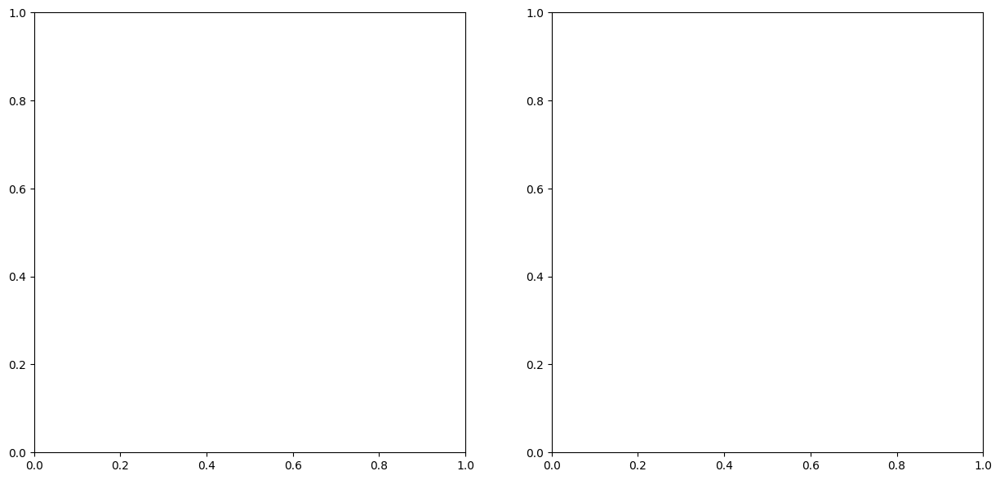

In [343]:
fig,ax=plt.subplots(1,2,figsize=(15,7))
directory = "..\\..\\STMdata\\20220811"
file = "Bias-Spectroscopy002.dat"
filePath=join(directory ,file)
database="STMdata.db"
#df_h=pd.read_csv(filePath,sep="\t",nrows=16)
#print(df_h[df_h.keys()]["Experiment"][15])
#df_d=pd.read_table(filePath,sep="\t",skiprows=16)
#print(df_d.keys())
#read_pointSpec(fig,ax,filePath,directory = "../STMdata/20220611",file = "001",offset=0,sigma=2)

STM_spec_info={"List_ID":1,"TIME_STAMP":2.0,"Date":"11.08.2022 12:15:27","User":"NaN","X_m":"91.6774E-9","Y_m":"91.6774E-9","Z_m":"91.6774E-9","Z_offset":"0","Settling_time":"4E-3","Integration_time":"8E-3","Z_Ctrl_hold":"TRUE","Final_Z":"-211.889E-9","Filter_type":"Gaussian","Order":"3","Cut_off":"","comment":""}
myfile=filePath
select_list_id="SELECT List_ID FROM STMdataLists WHERE UpdateFilePath='{}'".format(myfile)
select_time_stamp="SELECT TimeStamp FROM STMdataLists WHERE UpdateFilePath='{}'".format(myfile)
with sqlite3.connect(database) as conn:
        c = conn.cursor()
        data=c.execute(select_list_id)
        STMListID=data.fetchall()[0][0]
        data=c.execute(select_time_stamp)
        Time_stamp=data.fetchall()[0][0]
STM_spec_info["List_ID"]=STMListID
STM_spec_info["TIME_STAMP"]=Time_stamp
 
Notfound=1
skiprows=10
while Notfound:
    df_h=pd.read_csv(filePath,sep="\t",nrows=skiprows)

    dic_key=df_h[df_h.keys()]["Experiment"][skiprows-1]
    print(dic_key)

    if dic_key!= "[DATA]":
        Notfound=1
        skiprows+=1
    else:
        Notfound=0

        df_h=pd.read_csv(filePath,sep="\t",nrows=skiprows)
print(df_h,skiprows)
#print(df_h["bias spectroscopy"])
print(type(dict(df_h)))
print(df_h["bias spectroscopy"][0:-1])
Values=df_h["bias spectroscopy"][0:-1]
imagekeys=list(STM_spec_info.keys())
for i,value in enumerate(Values):
            
    STM_spec_info[imagekeys[i+2]]=value

print( STM_spec_info)

<>:39: SyntaxWarning: list indices must be integers or slices, not tuple; perhaps you missed a comma?
<>:39: SyntaxWarning: list indices must be integers or slices, not tuple; perhaps you missed a comma?


(150, 150, 14)
nparams[0:-1][0:-1][0] (150, 150)
                                                    0           1
0                                Grid dim="150 x 150"        None
1   Grid settings=5.235443E-7;-5.118322E-7;1.00000...        None
2                                     Filetype=Linear        None
3                             Sweep Signal="Bias (V)"        None
4            Fixed parameters="Sweep Start;Sweep End"        None
5   Experiment parameters="X (m);Y (m);Z (m);Z off...        None
6                            # Parameters (4 byte)=14        None
7                        Experiment size (bytes)=1536        None
8                                          Points=128        None
9   Channels="Current (A);LIX 1 omega (A);LIY 1 om...        None
10             Delay before measuring (s)=0.000000E+0        None
11                     Experiment="Grid Spectroscopy"        None
12                   Start time="21.11.2022 14:52:51"        None
13                     End 

C:\Users\js302\AppData\Local\Temp\ipykernel_17948\2224234326.py:39: SyntaxWarning: list indices must be integers or slices, not tuple; perhaps you missed a comma?
  channels=[x.split(",") for x in ovalue[9][1:-1].split(";")][:,0]
C:\Users\js302\AppData\Local\Temp\ipykernel_17948\2224234326.py:39: SyntaxWarning: list indices must be integers or slices, not tuple; perhaps you missed a comma?
  channels=[x.split(",") for x in ovalue[9][1:-1].split(";")][:,0]
C:\Users\js302\AppData\Local\Temp\ipykernel_17948\2224234326.py:39: SyntaxWarning: list indices must be integers or slices, not tuple; perhaps you missed a comma?
  channels=[x.split(",") for x in ovalue[9][1:-1].split(";")][:,0]
C:\Users\js302\AppData\Local\Temp\ipykernel_17948\2224234326.py:39: SyntaxWarning: list indices must be integers or slices, not tuple; perhaps you missed a comma?
  channels=[x.split(",") for x in ovalue[9][1:-1].split(";")][:,0]
C:\Users\js302\AppData\Local\Temp\ipykernel_17948\2224234326.py:39: SyntaxWarnin

TypeError: list indices must be integers or slices, not tuple

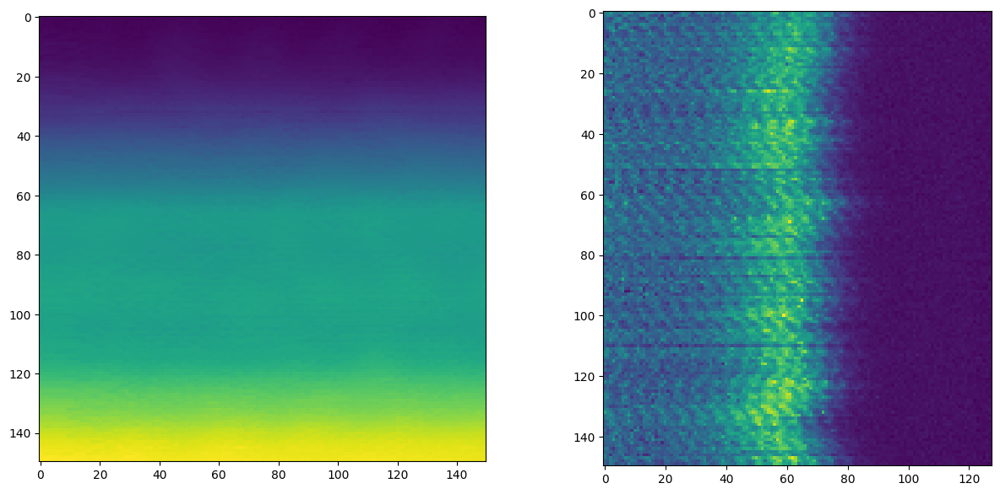

In [494]:
fig,ax=plt.subplots(1,2,figsize=(15,7))
directory = "../../STMdata/20221116"
file = "Grid Spectroscopy016.3ds"
myfile=join(directory ,file)
database="STMdata.db"
grid = nap.read.Grid(myfile) 
sweep=grid._derive_sweep_signal()
dic_keys = grid._load_data().keys()
list_data=list(grid._load_data())
params=grid._load_data()['params']
data=grid._load_data()['LIY 1 omega (A)']
head = grid.read_raw_header(byte_offset=850)
df=pd.DataFrame([x.split(",") for x in head.split("\r\n")])
#print(dic_keys)
#print(len(params))

print(np.array(params).shape)
nparams=np.array(params)
print("nparams[0:-1][0:-1][0]",nparams[:,:,4].shape)
ax[0].imshow(nparams[:,:,4])
ax[1].imshow(data[0])
print(df)
print(df.shape)
heads=[]
for dfi in df[0]:
    if dfi==":HEADER_END:":
        break
    heads.append(dfi)
print(heads)
    #print(dfi) 
ovalue=[]
for hs in heads:
    hvalue=[x.split(",") for x in hs.split("=")]
    ovalue.append(hvalue[1][0])


print(hvalue)
print(ovalue[9][1:-1])
channels=[x.split(",") for x in ovalue[9][1:-1].split(";")]
print(channels[1][0])

              Experiment            bias spectroscopy  Unnamed: 2
0                   Date          11.08.2022 12:15:27         NaN
1                   User                          NaN         NaN
2                  X (m)                   91.6774E-9         NaN
3                  Y (m)                    427.53E-9         NaN
4                  Z (m)                  -211.876E-9         NaN
5           Z offset (m)                         0E+0         NaN
6      Settling time (s)                         4E-3         NaN
7   Integration time (s)                         8E-3         NaN
8            Z-Ctrl hold                         TRUE         NaN
9            Final Z (m)                  -211.889E-9         NaN
10           Filter type                     Gaussian         NaN
11                 Order                            3         NaN
12            Cutoff frq                          NaN         NaN
13             Comment01  Bi@SiC graphene example1024         NaN
14        

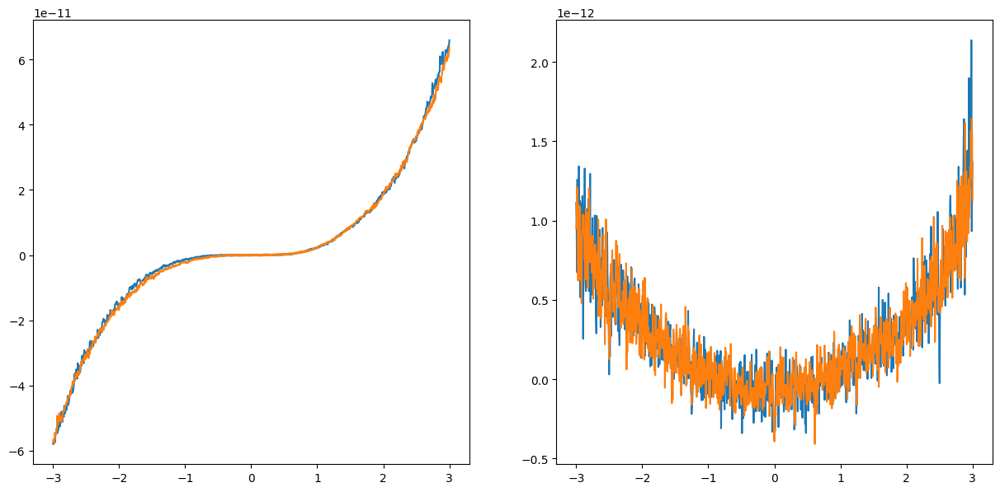

In [373]:
directory = "..\\..\\STMdata\\20220811"
file = "Bias-Spectroscopy002.dat"
filePath=join(directory ,file)
Notfound=1
skiprows=13
fig,ax=plt.subplots(1,2,figsize=(15,7))
while Notfound:
    df_h=pd.read_csv(filePath,sep="\t",nrows=skiprows)
    dic_key=df_h[df_h.keys()]["Experiment"][skiprows-1]

    if dic_key!= "[DATA]":
        Notfound=1
        skiprows+=1
    else:
        Notfound=0
        df_h=pd.read_csv(filePath,sep="\t",nrows=skiprows)

print(df_h)
skiprows=21
Notfound=1
while Notfound:

    df_d=pd.read_table(filePath,sep="\t",skiprows=skiprows)

    Keys=df_d.keys()

    if Keys[0]!= "Bias calc (V)":
        Notfound=1
        skiprows-=1
    else:
    
        df_d=pd.read_table(filePath,sep="\t",skiprows=skiprows)

        Keys=df_d.keys()
        print(list(Keys))
        Notfound=0
        I=np.array(df_d[Keys[1]])
        I_b=np.array(df_d["Current [bwd] (A)"])
        X=np.array(df_d[Keys[0]])
        IV=np.array(df_d[Keys[3]])
        IV_b=np.array(df_d["LIY 1 omega [bwd] (A)"])
ax[0].plot(X,I)
ax[0].plot(X,I_b)
ax[1].plot(X,IV)
ax[1].plot(X,IV_b)
    
    



In [5]:
def plot_topo(SXMfile,fig,ax,title="",scalecolor="white",scalesize=0.3): 
    Z_image=SXMfile.get_channel('Z')
    Z_image.correct_median_diff()
    Z_image.correct_lines() 
    x_n,y_n=Z_image.size["real"]["x"]*1e9,Z_image.size["real"]["y"]*1e9 
    img=Z_image.show(ax=ax,sig=None,cmap="Blues_r")
    ax.axis ('off')
    Vmin=np.ndarray.min(Z_image.pixels) 
    Vmax=np.ndarray.max(Z_image.pixels) 
    cb=fig.colorbar(img,ax=ax,orientation="vertical",pad=0.02,shrink=0.8) 
    cb.ax.yaxis.set_tick_params(size=0.8,labeltop=True) 
    cb.set_ticks([Vmax,Vmin])
    cb.set_ticklabels(["H","L"])
    scale=int(x_n/10) 
    scalebar=AnchoredSizeBar(ax.transData,scale*2,"{0} nm".format(scale*2),"lower right",pad=1,sep=3,color=scalecolor,label_top=True,frameon=False,size_vertical=scalesize)
    ax.add_artist(scalebar)
    ax.set_title(title) 
    return img

def plot_image(filePath):
    SXMfile=pySPM.SXM(filePath)
    header=SXMfile.header
    Bias=header['BIAS'][0][0]
    Curr=header['Z-CONTROLLER'][1][3]
    Z_image=SXMfile.get_channel('Z')
    Z_image.correct_median_diff()
    Z_image.correct_lines()
    x_n,y_n=Z_image.size["real"]["x"]*1e9,Z_image.size["real"]["y"]*1e9
    y_p,x_p=Z_image.size["pixels"]["y"],Z_image.size["pixels"]["x"]  
    
    fig,ax=plt.subplots(1,1,figsize=(10,10))
    imgTopo=plot_topo(SXMfile=SXMfile,fig=fig,ax=ax)

    fig.suptitle(filePath)

def plot_STS(filePath):
    df=pd.read_table(filePath,sep="\t",skiprows=17)
    fig,(ax0,ax1)=plt.subplots(1,2,figsize=(14,5))
    ax0.plot(df["Bias calc (V)"],df["Current (A)"])
    ax1.plot(df["Bias calc (V)"],df["LIY 1 omega (A)"])
    ax0.set_title(filePath)
    
def plot_spetrum(filePath,ax,label=r"$dI/dV$",offset=0):
    df=pd.read_table(filePath,sep="\t",skiprows=17)
    sts_filtered=gaussian_filter(df["LIY 1 omega (A)"],sigma=2)
    ax.plot(df["Bias calc (V)"],sts_filtered*1e12+offset,label=label)
    ax.legend()
    
def read_pointSpec(fig,ax,filePath,directory = "../STMdata/20220223",file = "001",offset=0,sigma=2):
    
    filePath=filePath
    df_h=pd.read_csv(filePath,sep="\t",nrows=15)
    #print(df_h)
    x=df_h["bias spectroscopy"][2]
    y=df_h["bias spectroscopy"][3]
    z=df_h["bias spectroscopy"][4]
    #print(x,y,z)
    

    xlabel="Sample bias (V)"
    ylabel=r"$dI/dV$ ($a.u.$)"
    Ilabel=r"$I$ ($a.u.$)"
    title=r"The waterfall of $STS$ along the cut line"
    df=pd.read_table(filePath,sep="\t",skiprows=17)
    sts_filtered=gaussian_filter(df["LIY 1 omega (A)"],sigma=sigma)
    I_filtered=gaussian_filter(df["Current (A)"],sigma=sigma)
    X=np.array(df["Bias calc (V)"])
    Y=sts_filtered*1e12+offset
    ax[0].plot(X,Y,label=ylabel)
    #ax[0].legend()
    ax[0].set_title(filePath)
    ax[1].plot(X,I_filtered*1e12,label=Ilabel)
    #ax[1].legend()
    ax[1].set_title(filePath)
    return x,y,z


def read_file_para(filePath):
    SXMfile=pySPM.SXM(filePath)
    header=SXMfile.header
    print(header)
    [x_n,y_n]=header['SCAN_RANGE'][0]
    Bias=header['BIAS'][0][0]
    Curr=header['Z-CONTROLLER'][1][3]
    Pos=header['SCAN_OFFSET'][0]
    return Bias,Curr,Pos,x_n
def read_grid_par(filePath):
    grid = nap.read.Grid(filePath) 
    sweep=grid._derive_sweep_signal()
    omegaYArray = grid._load_data()['LIY 1 omega (A)']
    params=grid._load_data()['params']
    head = grid.read_raw_header(byte_offset=745)
    df=pd.DataFrame([x.split(",") for x in head.split("\r\n")])
    #print(df)
    #print(df[0][0],df[0][1],df[0][8])
    Res=[j for j in df[0][0].split("=")]
    Set=[j for j in df[0][1].split(";")]
    Point=[j for j in df[0][8].split("=")]
    #print(Res)
    #print("---------")
    #print(Set)
    #print("---------")
    #print(Point)
    Resxy=[j for j in Res[1].split("x")]
    xpoints=[j for j in Set[0].split("=")]

    Resoltion=[float(Resxy[0][1:]),float(Resxy[1][:3]),float(Point[1])]
    position=[float(xpoints[1]),float(Set[1])]
    size=[float(Set[2]),float(Set[3])]

    return Resoltion,position,size
    
def read_file(filePath):
    SXMfile=pySPM.SXM(filePath)
    header=SXMfile.header
    
    Bias=header['BIAS'][0][0]
    Curr=header['Z-CONTROLLER'][1][3]
    Pos=header['SCAN_OFFSET'][0]
    print(Pos)
    Z_image=SXMfile.get_channel('Z')
    #Z_image.correct_median_diff()
    Z_image.correct_lines()
    x_n,y_n=Z_image.size["real"]["x"]*1e9,Z_image.size["real"]["y"]*1e9
    y_p,x_p=Z_image.size["pixels"]["y"],Z_image.size["pixels"]["x"]
    print("the file is {0},\r\nthe Bias is {1} V,the current is {4} A, the size is {2}*{2} nm,the resolution is {3}*{3} pix ".format(filePath,float(Bias),int(x_n),x_p,Curr))
    return Z_image,x_n


def write_database_image(myfiles,count=0):
    STMdata=[]
    #STMdate={"ID":1,"Name":"SiC001","RecFilePath":"","UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}
    STMimage={"ID":1,"TIME_STAMP":100,"NANONIS_VERSION":"SiC001","REC_DATE":"","REC_TIME":"","REC_TEMP":290,"ACQ_TIME":20.0,"SCAN_PIXELS":512,"SCAN_FILE":"","SCAN_TIME":30.0,"SCAN_RANGE":20,"SCAN_OFFSET":"","SCAN_ANGLE":10.0,"SCAN_DIR":'up',"Time":'09:09:29',"BIAS": 2.5,"Z_CONTROLLER": "","COMMENT":"SXM","Session Path":"","UI_Release":"","RT_Release":"","RT_Frequency":"","Signals_Oversampling":"","Animations_Period":"","Indicators_Period":"","Measurements_Period":"","DATA_INFO":"","SCANIT_END":"","List_ID":1}
    count=count
    database = "STMdata.db"
    fect="SELECT ID FROM STMdataList"
    
    format_string='%d.%m.%Y %H:%M:%S'
    if count!=0:
        with sqlite3.connect(database) as conn:
            c = conn.cursor()
            data=c.execute(fect)
            count=data.fetchall()[-1][0]+1
    for j, myfile in enumerate(myfiles):     
        try:
            if myfile.endswith(".sxm"):
                fect_ID_wh="SELECT ID FROM STMdataList WHERE UpdateFilePath={}".formate(myfiles)
                with sqlite3.connect(database) as conn:
                    c = conn.cursor()
                    data=c.execute(fect)
                    STMListID=data.fetchone()[0]
                
                #STMdate={"ID":1,"Name":"SiC001","TimeStamp":"","UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}

                
                SXMfile=pySPM.SXM(myfile)
                header=SXMfile.header
                [x_n,y_n]=header['SCAN_RANGE'][0]
                Bias=header['BIAS'][0][0]
                Curr=header['Z-CONTROLLER'][1][3]
                Pos=header['SCAN_OFFSET'][0]
                FilePath=header['SCAN_FILE'][0][0]+header['SCAN_FILE'][0][1]
                REC_Data=header['REC_DATE'][0][0]
                REC_Time=header['REC_TIME'][0][0]
                file=[f for f in FilePath.split(".")]
                filetype=file[1]
                fileData=[f for f in file[0].split("\\")]
                fileName=fileData[-1]
                #print(j)
                date_time_s=REC_Data+" "+REC_Time
                timestamp = string_to_timestamp(date_time_s,format_string)
                STMimage["ID"]=count+j
                STMimage["TIME_STAMP"]=timestamp
                for i,value in enumerate(header.values()):
                    
                    STMimage.values()[i+2]=value
                    
                STMdate["TimeStamp"]=timestamp
                STMdate["UpdateFilePath"]=myfile
                STMdate["Date"]=REC_Data
                STMdate["Time"]=REC_Time
                STMdate["Bias_V"]=round(float(Bias),2)
                STMdate["Current_pA"]=round(float(Curr)*1e12,1)
                STMdate["Type"]=filetype
                STMdate["PosX_nm"]=round(float(Pos[0])*1e9,3)
                STMdate["PosY_nm"]=round(float(Pos[1])*1e9,3)
                key=",".join(STMdate.keys())
                value=",".join(["?"]*len(STMdate))
                insert="INSERT INTO STMdataList({}) VALUES({})".format(key,value)
                
                with sqlite3.connect(database) as conn:
                    c = conn.cursor()
                    #c.execute(drop_project_table)
                    #c.execute(sql_create_projects_table)
                    c.execute(insert,tuple(STMdate.values()))
        except:
            pass

def write_database_namelist(myfiles,count=0):
    STMdata=[]
    STMdate={"ID":1,"Name":"SiC001","RecFilePath":"","UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}
    count=count
    database = "STMdata.db"
    fect="SELECT ID FROM STMdataList"
    format_string='%d.%m.%Y %H:%M:%S'
    if count!=0:
        with sqlite3.connect(database) as conn:
            c = conn.cursor()
            data=c.execute(fect)
            count=data.fetchall()[-1][0]+1
    for j, myfile in enumerate(myfiles):     
        try:
            if myfile.endswith(".sxm"):
                STMdate={"ID":1,"Name":"SiC001","TimeStamp":"","UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}
                SXMfile=pySPM.SXM(myfile)
                header=SXMfile.header
                [x_n,y_n]=header['SCAN_RANGE'][0]
                Bias=header['BIAS'][0][0]
                Curr=header['Z-CONTROLLER'][1][3]
                Pos=header['SCAN_OFFSET'][0]
                FilePath=header['SCAN_FILE'][0][0]+header['SCAN_FILE'][0][1]
                REC_Data=header['REC_DATE'][0][0]
                REC_Time=header['REC_TIME'][0][0]
                file=[f for f in FilePath.split(".")]
                filetype=file[1]
                fileData=[f for f in file[0].split("\\")]
                fileName=fileData[-1]
                #print(j)
                date_time_s=REC_Data+" "+REC_Time
                timestamp = string_to_timestamp(date_time_s,format_string)
                STMdate["ID"]=count+j
                STMdate["Name"]=fileName
                STMdate["TimeStamp"]=timestamp
                STMdate["UpdateFilePath"]=myfile
                STMdate["Date"]=REC_Data
                STMdate["Time"]=REC_Time
                STMdate["Bias_V"]=round(float(Bias),2)
                STMdate["Current_pA"]=round(float(Curr)*1e12,1)
                STMdate["Type"]=filetype
                STMdate["PosX_nm"]=round(float(Pos[0])*1e9,3)
                STMdate["PosY_nm"]=round(float(Pos[1])*1e9,3)
                key=",".join(STMdate.keys())
                value=",".join(["?"]*len(STMdate))
                insert="INSERT INTO STMdataList({}) VALUES({})".format(key,value)
                
                with sqlite3.connect(database) as conn:
                    c = conn.cursor()
                    #c.execute(drop_project_table)
                    #c.execute(sql_create_projects_table)
                    c.execute(insert,tuple(STMdate.values()))
                    #print(STMdate)
            if myfile.endswith(".dat"): 
                STMdate={"ID":1,"Name":"SiC001","TimeStamp":"","UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}
                format_string='%d.%m.%Y %H:%M:%S'
                
                filePath=myfile
                Notfound=1
                skiprows=13
                while Notfound:
                    df_h=pd.read_csv(filePath,sep="\t",nrows=skiprows)

                    dic_key=df_h[df_h.keys()]["Experiment"][skiprows-1]

                    if dic_key!= "[DATA]":
                        Notfound=1
                        skiprows+=1
                    else:
                        Notfound=0
                        df_h=pd.read_csv(filePath,sep="\t",nrows=skiprows)

                file=[f for f in filePath.split(".")]
                filetype=file[-1]
                fileName=[f for f in file[-2].split("/")][-1]
                
                STMdate["Name"]=fileName
                
                STMdate["UpdateFilePath"]=myfile
                STMdate["ID"]=count+j
                x=df_h["bias spectroscopy"][2]
                y=df_h["bias spectroscopy"][3]
                z=df_h["bias spectroscopy"][4]
                date=df_h["bias spectroscopy"][0]
                [d,t]=[d for d in date.split(" ")]
                date_time_s=d+" "+t
                timestamp = string_to_timestamp(date_time_s,format_string)
                STMdate["Date"]=d
                STMdate["Time"]=t
                STMdate["TimeStamp"]=timestamp
                STMdate["Type"]=filetype
                STMdate["PosX_nm"]=round(float(x)*1e9,3)
                STMdate["PosY_nm"]=round(float(y)*1e9,3)
                Notfound=1
                skiprows=20
                while Notfound:

                    df_d=pd.read_table(filePath,sep="\t",skiprows=skiprows)

                    Keys=df_d.keys()

                    if Keys[0]!= "Bias calc (V)":
                        Notfound=1
                        skiprows-=1
                    else:
                    #sts=df["LIY 1 omega (A)"]
                        df_d=pd.read_table(filePath,sep="\t",skiprows=skiprows)

                        Keys=df_d.keys()
                        Notfound=0
                        I=df_d[Keys[1]]
                        X=np.array(df_d[Keys[0]])
                    
                    
                Bias=X[0]
                Curr=I[0]
                STMdate["Bias_V"]=round(float(Bias),2)
                STMdate["Current_pA"]=round(float(Curr)*1e12,1)
                key=",".join(STMdate.keys())
                value=",".join(["?"]*len(STMdate))
                insert="INSERT INTO STMdataList({}) VALUES({})".format(key,value)
                
                with sqlite3.connect(database) as conn:
                    c = conn.cursor()
                    #c.execute(drop_project_table)
                    #c.execute(sql_create_projects_table)
                    c.execute(insert,tuple(STMdate.values()))
                    #print(STMdate)
            if myfile.endswith(".3ds"):
                STMdate={"ID":1,"Name":"SiC001","TimeStamp":"","UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}
                format_string='%d.%m.%Y %H:%M:%S'
                filePath=myfile
                file=[f for f in filePath.split(".")]
                filetype=file[-1]
                fileName=[f for f in file[-2].split("/")][-1]
                #print(filetype)
                #STMdate["Name"]=fileName
                #print(fileName)

                grid = nap.read.Grid(filePath) 
                sweep=grid._derive_sweep_signal()
                dic_keys = grid._load_data().keys()
                list_data=list(grid._load_data())
                params=grid._load_data()['params']
                head = grid.read_raw_header(byte_offset=745)
                df=pd.DataFrame([x.split(",") for x in head.split("\r\n")])
                #print(df)
                #print(df[0][0],df[0][1],df[0][8])
                Res=[j for j in df[0][0].split("=")]
                Set=[j for j in df[0][1].split(";")]
                Point=[j for j in df[0][8].split("=")]
                Date=[j for j in df[0][12].split("=")]
                DateTime=[j for j in Date[1].split(" ")]
                #print(DateTime[0])
                Recdate=DateTime[0][1:]
                Rectime=DateTime[1][:-1]
                #print("---------")
                #print(Recdate)
                #print("---------")
                #print(Rectime)
                Resxy=[j for j in Res[1].split("x")]
                xpoints=[j for j in Set[0].split("=")]

                Resoltion=[float(Resxy[0][1:]),float(Resxy[1][:-1]),float(Point[1])]
                position=[float(xpoints[1]),float(Set[1])]
                size=[float(Set[2]),float(Set[3])]
                #print(Resoltion,position,size)
                date_time_s=Recdate+" "+Rectime
                timestamp = string_to_timestamp(date_time_s,format_string)

                STMdate["ID"]=count+j
                STMdate["Name"]=fileName
                STMdate["TimeStamp"]=timestamp
                STMdate["UpdateFilePath"]=myfile
                STMdate["Date"]=Recdate
                STMdate["Time"]=Rectime
                STMdate["Bias_V"]=round(float(0),2)
                STMdate["Current_pA"]=round(float(0)*1e12,1)
                STMdate["Type"]=filetype
                STMdate["PosX_nm"]=round(float(position[0])*1e9,3)
                STMdate["PosY_nm"]=round(float(position[1])*1e9,3)
                key=",".join(STMdate.keys())
                value=",".join(["?"]*len(STMdate))
                insert="INSERT INTO STMdataList({}) VALUES({})".format(key,value)
                
                with sqlite3.connect(database) as conn:
                    c = conn.cursor()
                    #c.execute(drop_project_table)
                    #c.execute(sql_create_projects_table)
                    c.execute(insert,tuple(STMdate.values()))
                    #print(STMdate)
        except Exception as ex:
            print("Erro",myfile)
            print(insert,tuple(STMdate.values()))
            if hasattr(ex,"message"): 
                print("Erro",ex.message)
            else:
                print(ex)
        finally:
            pass
        
              



        
        
        
def string_to_timestamp(date_string, format_string='%Y-%m-%d %H:%M:%S'):
    try:
        # Parse the date string into a datetime object
        date_obj = datetime.datetime.strptime(date_string, format_string)

        # Convert the datetime object to a timestamp
        timestamp = date_obj.timestamp()
        return timestamp
    except ValueError as e:
        print(f"Error: {e}")
        return None



In [6]:
def plot_topo(SXMfile,fig,ax,title="",scalecolor="white",scalesize=0.3): 
    Z_image=SXMfile.get_channel('Z')
    Z_image.correct_median_diff()
    Z_image.correct_lines() 
    x_n,y_n=Z_image.size["real"]["x"]*1e9,Z_image.size["real"]["y"]*1e9 
    img=Z_image.show(ax=ax,sig=None,cmap="Blues_r")
    ax.axis ('off')
    Vmin=np.ndarray.min(Z_image.pixels) 
    Vmax=np.ndarray.max(Z_image.pixels) 
    cb=fig.colorbar(img,ax=ax,orientation="vertical",pad=0.02,shrink=0.8) 
    cb.ax.yaxis.set_tick_params(size=0.8,labeltop=True) 
    cb.set_ticks([Vmax,Vmin])
    cb.set_ticklabels(["H","L"])
    scale=int(x_n/10) 
    scalebar=AnchoredSizeBar(ax.transData,scale*2,"{0} nm".format(scale*2),"lower right",pad=1,sep=3,color=scalecolor,label_top=True,frameon=False,size_vertical=scalesize)
    ax.add_artist(scalebar)
    ax.set_title(title) 
    return img

def plot_image(filePath):
    SXMfile=pySPM.SXM(filePath)
    header=SXMfile.header
    Bias=header['BIAS'][0][0]
    Curr=header['Z-CONTROLLER'][1][3]
    Z_image=SXMfile.get_channel('Z')
    Z_image.correct_median_diff()
    Z_image.correct_lines()
    x_n,y_n=Z_image.size["real"]["x"]*1e9,Z_image.size["real"]["y"]*1e9
    y_p,x_p=Z_image.size["pixels"]["y"],Z_image.size["pixels"]["x"]  
    
    fig,ax=plt.subplots(1,1,figsize=(10,10))
    imgTopo=plot_topo(SXMfile=SXMfile,fig=fig,ax=ax)

    fig.suptitle(filePath)

def plot_STS(filePath):
    df=pd.read_table(filePath,sep="\t",skiprows=17)
    fig,(ax0,ax1)=plt.subplots(1,2,figsize=(14,5))
    ax0.plot(df["Bias calc (V)"],df["Current (A)"])
    ax1.plot(df["Bias calc (V)"],df["LIY 1 omega (A)"])
    ax0.set_title(filePath)
    
def plot_spetrum(filePath,ax,label=r"$dI/dV$",offset=0):
    df=pd.read_table(filePath,sep="\t",skiprows=17)
    sts_filtered=gaussian_filter(df["LIY 1 omega (A)"],sigma=2)
    ax.plot(df["Bias calc (V)"],sts_filtered*1e12+offset,label=label)
    ax.legend()
    
def read_pointSpec(fig,ax,filePath,directory = "../STMdata/20220223",file = "001",offset=0,sigma=2):
    
    filePath=filePath
    df_h=pd.read_csv(filePath,sep="\t",nrows=15)
    #print(df_h)
    x=df_h["bias spectroscopy"][2]
    y=df_h["bias spectroscopy"][3]
    z=df_h["bias spectroscopy"][4]
    #print(x,y,z)
    

    xlabel="Sample bias (V)"
    ylabel=r"$dI/dV$ ($a.u.$)"
    Ilabel=r"$I$ ($a.u.$)"
    title=r"The waterfall of $STS$ along the cut line"
    df=pd.read_table(filePath,sep="\t",skiprows=17)
    sts_filtered=gaussian_filter(df["LIY 1 omega (A)"],sigma=sigma)
    I_filtered=gaussian_filter(df["Current (A)"],sigma=sigma)
    X=np.array(df["Bias calc (V)"])
    Y=sts_filtered*1e12+offset
    ax[0].plot(X,Y,label=ylabel)
    #ax[0].legend()
    ax[0].set_title(filePath)
    ax[1].plot(X,I_filtered*1e12,label=Ilabel)
    #ax[1].legend()
    ax[1].set_title(filePath)
    return x,y,z


def read_file_para(filePath):
    SXMfile=pySPM.SXM(filePath)
    header=SXMfile.header
    print(header)
    [x_n,y_n]=header['SCAN_RANGE'][0]
    Bias=header['BIAS'][0][0]
    Curr=header['Z-CONTROLLER'][1][3]
    Pos=header['SCAN_OFFSET'][0]
    return Bias,Curr,Pos,x_n
def read_grid_par(filePath):
    grid = nap.read.Grid(filePath) 
    sweep=grid._derive_sweep_signal()
    omegaYArray = grid._load_data()['LIY 1 omega (A)']
    params=grid._load_data()['params']
    head = grid.read_raw_header(byte_offset=745)
    df=pd.DataFrame([x.split(",") for x in head.split("\r\n")])
    #print(df)
    #print(df[0][0],df[0][1],df[0][8])
    Res=[j for j in df[0][0].split("=")]
    Set=[j for j in df[0][1].split(";")]
    Point=[j for j in df[0][8].split("=")]
    #print(Res)
    #print("---------")
    #print(Set)
    #print("---------")
    #print(Point)
    Resxy=[j for j in Res[1].split("x")]
    xpoints=[j for j in Set[0].split("=")]

    Resoltion=[float(Resxy[0][1:]),float(Resxy[1][:3]),float(Point[1])]
    position=[float(xpoints[1]),float(Set[1])]
    size=[float(Set[2]),float(Set[3])]

    return Resoltion,position,size
    
def read_file(filePath):
    SXMfile=pySPM.SXM(filePath)
    header=SXMfile.header
    
    Bias=header['BIAS'][0][0]
    Curr=header['Z-CONTROLLER'][1][3]
    Pos=header['SCAN_OFFSET'][0]
    print(Pos)
    Z_image=SXMfile.get_channel('Z')
    #Z_image.correct_median_diff()
    Z_image.correct_lines()
    x_n,y_n=Z_image.size["real"]["x"]*1e9,Z_image.size["real"]["y"]*1e9
    y_p,x_p=Z_image.size["pixels"]["y"],Z_image.size["pixels"]["x"]
    print("the file is {0},\r\nthe Bias is {1} V,the current is {4} A, the size is {2}*{2} nm,the resolution is {3}*{3} pix ".format(filePath,float(Bias),int(x_n),x_p,Curr))
    return Z_image,x_n


def write_database_image(myfiles,count=0):
    STMdata=[]
    #STMdate={"ID":1,"Name":"SiC001","RecFilePath":"","UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}
    STMimage={"ID":1,"TIME_STAMP":100,"NANONIS_VERSION":"SiC001","REC_DATE":"","REC_TIME":"","REC_TEMP":290,"ACQ_TIME":20.0,"SCAN_PIXELS":512,"SCAN_FILE":"","SCAN_TIME":30.0,"SCAN_RANGE":20,"SCAN_OFFSET":"","SCAN_ANGLE":10.0,"SCAN_DIR":'up',"Time":'09:09:29',"BIAS": 2.5,"Z_CONTROLLER": "","COMMENT":"SXM","Session Path":"","UI_Release":"","RT_Release":"","RT_Frequency":"","Signals_Oversampling":"","Animations_Period":"","Indicators_Period":"","Measurements_Period":"","DATA_INFO":"","SCANIT_END":"","List_ID":1}
    count=count
    database = "STMdata.db"
    fect="SELECT ID FROM STMdataList"
    
    format_string='%d.%m.%Y %H:%M:%S'
    if count!=0:
        with sqlite3.connect(database) as conn:
            c = conn.cursor()
            data=c.execute(fect)
            count=data.fetchall()[-1][0]+1
    for j, myfile in enumerate(myfiles):     
        try:
            if myfile.endswith(".sxm"):
                fect_ID_wh="SELECT ID FROM STMdataList WHERE UpdateFilePath={}".formate(myfiles)
                with sqlite3.connect(database) as conn:
                    c = conn.cursor()
                    data=c.execute(fect)
                    STMListID=data.fetchone()[0]
                
                #STMdate={"ID":1,"Name":"SiC001","TimeStamp":"","UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}

                
                SXMfile=pySPM.SXM(myfile)
                header=SXMfile.header
                [x_n,y_n]=header['SCAN_RANGE'][0]
                Bias=header['BIAS'][0][0]
                Curr=header['Z-CONTROLLER'][1][3]
                Pos=header['SCAN_OFFSET'][0]
                FilePath=header['SCAN_FILE'][0][0]+header['SCAN_FILE'][0][1]
                REC_Data=header['REC_DATE'][0][0]
                REC_Time=header['REC_TIME'][0][0]
                file=[f for f in FilePath.split(".")]
                filetype=file[1]
                fileData=[f for f in file[0].split("\\")]
                fileName=fileData[-1]
                #print(j)
                date_time_s=REC_Data+" "+REC_Time
                timestamp = string_to_timestamp(date_time_s,format_string)
                STMimage["ID"]=count+j
                STMimage["TIME_STAMP"]=timestamp
                for i,value in enumerate(header.values()):
                    
                    STMimage.values()[i+2]=value
                    
                STMdate["TimeStamp"]=timestamp
                STMdate["UpdateFilePath"]=myfile
                STMdate["Date"]=REC_Data
                STMdate["Time"]=REC_Time
                STMdate["Bias_V"]=round(float(Bias),2)
                STMdate["Current_pA"]=round(float(Curr)*1e12,1)
                STMdate["Type"]=filetype
                STMdate["PosX_nm"]=round(float(Pos[0])*1e9,3)
                STMdate["PosY_nm"]=round(float(Pos[1])*1e9,3)
                key=",".join(STMdate.keys())
                value=",".join(["?"]*len(STMdate))
                insert="INSERT INTO STMdataList({}) VALUES({})".format(key,value)
                
                with sqlite3.connect(database) as conn:
                    c = conn.cursor()
                    #c.execute(drop_project_table)
                    #c.execute(sql_create_projects_table)
                    c.execute(insert,tuple(STMdate.values()))
        except:
                pass
def drop_creat_new_table():
    database = "STMdata.db"
    drop_project_table="DROP TABLE IF EXISTS STMdataList"
    sql_create_projects_table = """ CREATE TABLE IF NOT EXISTS STMdataList (
                                        ID   INTEGER PRIMARY KEY,
                                        Name TEXT NOT NULL,
                                        TimeStamp REAL,
                                        UpdateFilePath TEXT,
                                        Date TEXT NOT NULL,
                                        Time TEXT NOT NULL,
                                        Bias_V REAL NOT NULL,
                                        Current_pA REAL NOT NULL,
                                        Type TEXT NOT NULL,
                                        PosX_nm  REAL NOT NULL, 
                                        PosY_nm REAL NOT NULL
                                    ) """


    drop_task_table="DROP TABLE IF EXISTS STMdata"
    sql_create_tasks_table = """CREATE TABLE IF NOT EXISTS STMdata(
                                    ID integer PRIMARY KEY,
                                    Name text NOT NULL,
                                    RecFilePath TEXT,
                                    UpdateFilePath TEXT,
                                    Date TEXT,
                                    Time TEXT,
                                    Type TEXT,
                                    PosX_nm REAL, 
                                    PosY_nm REAL,
                                    STMdataList_ID integer FOREIGN KEY REFERENCES STMdataList.ID,
                                    Data BLOB
                                );"""

    insert_sql="INSERT INTO STMdataList (ID,Name,FilePath,Date,Time,Type,Bias_V,Current_pA,PosX_nm,PosY_nm) VALUES(1, 'SiC001', '../STMdata/20230201', '20230201', '12:00', 'SXMimage', 1.8, 30,230, 250 )"
    #print(insert_sql)
    fect="SELECT * FROM STMdataList"
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        #c.close()
        c.execute(drop_project_table)
        c.execute(sql_create_projects_table)
        #c.execute(insert_sql)
        data=c.execute(fect)
        #print(data.fetchone())

        
        
        
def string_to_timestamp(date_string, format_string='%Y-%m-%d %H:%M:%S'):
    try:
        # Parse the date string into a datetime object
        date_obj = datetime.datetime.strptime(date_string, format_string)

        # Convert the datetime object to a timestamp
        timestamp = date_obj.timestamp()
        return timestamp
    except ValueError as e:
        print(f"Error: {e}")
        return None

    
    
    
def write_STM_data_all(myfiles,count):
    count=count
    database = "STMdata.db"
    fect="SELECT Data_ID FROM STMimageValue"
    
    format_string='%d.%m.%Y %H:%M:%S'
    if count!=0:
        with sqlite3.connect(database) as conn:
            c = conn.cursor()
            data=c.execute(fect)
            count=data.fetchall()[-1][0]+1
    for j,myfile in enumerate(myfiles):
        write_STM_data_single(myfile,count+j)
        
def write_STM_data_single(filePath,count):
    database = "STMdata.db"
    myfile=filePath
    STMimageData={"Data_ID":1,"Info_ID":1,"List_ID":1,"TIME_STAMP":1}
    STMimageDataKeys=list(STMimageData.keys())
    count=count
    if myfile.endswith(".sxm"):
        fect_ID_wh="SELECT ID FROM STMdataList WHERE UpdateFilePath='{}'".format(myfile)
        print(fect_ID_wh)
        with sqlite3.connect(database) as conn:
            c = conn.cursor()
            data=c.execute(fect_ID_wh)
            STMListID=data.fetchone()[0]
        fect_ID="SELECT Info_ID FROM STMimageInfo WHERE List_ID={}".format(STMListID)
        fect_time="SELECT TIME_STAMP FROM STMimageInfo WHERE List_ID={}".format(STMListID)
        with sqlite3.connect(database) as conn:
                c = conn.cursor()
                data=c.execute(fect_ID)
                InfoID=data.fetchone()[0]
                data=c.execute(fect_time)
                Time_stamp=data.fetchone()[0]
        print(STMListID,InfoID,Time_stamp)
        STMimageDataValues=[InfoID,InfoID,STMListID,Time_stamp]

        SXMfile=pySPM.SXM(filePath)
        header=SXMfile.header
        h=header["DATA_INFO"][0]
        i=h.index("Name")
        channels=[]
        for z in header["DATA_INFO"][1:]:
            channels.append(z[i]) 
        print(channels)
        STMKeys=["Z","Current","LIY_1_omega"]
        for channel in channels:
            if channel in STMKeys:
                try:
                    image_f=SXMfile.get_channel(channel,direction="forward")
                    image=np.array(image_f.pixels)
                    array_bytes_f = image.tobytes()
                    STMimageDataValues.append(sqlite3.Binary(array_bytes_f))
                    image_b=SXMfile.get_channel(channel,direction="backward")
                    image=np.array(image_b.pixels)
                    array_bytes_b = image.tobytes()
                    STMimageDataValues.append(sqlite3.Binary(array_bytes_b))
                    STMimageDataKeys.append(channel+"_forward")
                    STMimageDataKeys.append(channel+"_backward")
                except:
                    pass
        STMdate=dict(zip(STMimageDataKeys,STMimageDataValues))
        key=",".join(STMdate.keys())
        value=",".join(["?"]*len(STMdate))
        insert="INSERT INTO STMimageValue({}) VALUES({})".format(key,value)
        try:

            with sqlite3.connect(database) as conn:
                c = conn.cursor()
                #c.execute(drop_project_table)
                #c.execute(sql_create_projects_table)
                c.execute(insert,tuple(STMdate.values()))
        except:
            STMdate=dict(zip(STMimageDataKeys[:5],STMimageDataValues[:5]))
            key=",".join(STMdate.keys())
            value=",".join(["?"]*len(STMdate))
            insert="INSERT INTO STMimageValue({}) VALUES({})".format(key,value)
                

In [7]:
def insert_array_to_db(conn, numpy_array):
    # Convert the NumPy array to bytes object
    array_bytes = numpy_array.tobytes()
    
    # Insert the bytes object into the database as BLOB
    cursor = conn.cursor()
    cursor.execute("INSERT INTO array_data (array_blob) VALUES (?)", (sqlite3.Binary(array_bytes),))
    conn.commit()

def retrieve_array_from_db(conn, row_id):
    # Query to retrieve the BLOB data
    cursor = conn.cursor()
    cursor.execute("SELECT array_blob FROM array_data WHERE id=?", (row_id,))
    blob_data = cursor.fetchone()[0]

    # Convert the BLOB data back to a NumPy array
    retrieved_array = np.frombuffer(blob_data, dtype=np.int).reshape((3, 3))
    return retrieved_array

In [8]:
mydir="../STMdata"
myFiledirs=[join(mydir,Fold) for Fold in os.listdir(mydir)]
myFiledirs.sort(key=os.path.getmtime)

filePathsA=[[],]
#print(myFiledirs)
for myFolder in myFiledirs[:-1]: 
    
    mypath=myFolder
    files=[f for f in os.listdir(mypath) if isfile(join(mypath,f))]
    filePaths=[join(mypath,file) for file in files]
    filePaths.sort(key=os.path.getmtime)  
#print(len(myFiledirs[:-1]))
count=0
for mydir in myFiledirs[:-1]:
    myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
    myfiles.sort(key=os.path.getmtime)
    
    write_STM_data_all(myfiles,count=count)
    count=count+1
    


SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220608/Ag(111)#1001.sxm'
0 0 1654666776.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220608/SiC#68001.sxm'
1 1 1654667695.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220608/SiC#68002.sxm'
2 2 1654668992.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220608/SiC#68003.sxm'
4 3 1654672371.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220608/SiC#68004.sxm'
5 4 1654672371.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220608/SiC#68005.sxm'
6 5 1654674301.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220608/SiC#68006.sxm'
7 6 1654674896.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220608/SiC#68007.sxm'
8 7 1654677158.0
['Z', 'Bias', 

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220615/SiC0615006.sxm'
92 64 1655275830.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220620/SiC0615001.sxm'
95 65 1655684345.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220620/SiC0615002.sxm'
96 66 1655685650.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220620/SiC0615003.sxm'
97 67 1655686939.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220620/SiC0615004.sxm'
98 68 1655688060.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220620/SiC0615005.sxm'
99 69 1655691944.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220620/SiC0615006.sxm'
100 70 1655694733.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220620/BI@SiC0620001.sxm'
101 71 1

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220623/BI@SiC022.sxm'
178 127 1655979617.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220623/BI@SiC023.sxm'
179 128 1656025606.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220623/BI@SiC024.sxm'
180 129 1656026980.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220623/BI@SiC025.sxm'
181 130 1656027567.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220623/BI@SiC026.sxm'
182 131 1656028283.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220623/BI@SiC027.sxm'
183 132 1656028573.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220623/BI@SiC028.sxm'
184 133 1656028833.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220623/BI@SiC029.sxm'
185 13

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220628/BI@SiC001.sxm'
251 191 1656397852.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220628/BI@SiC002.sxm'
252 192 1656406456.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220628/BI@SiC003.sxm'
253 193 1656408056.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220628/BI@SiC004.sxm'
254 194 1656408548.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220628/BI@SiC005.sxm'
255 195 1656409578.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220628/BI@SiC006.sxm'
256 196 1656411564.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220628/BI@SiC007.sxm'
257 197 1656458740.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220629/Ag(111)001.sxm'
258 1

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220705/Bi@SiC018.sxm'
315 255 1657016824.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220705/Bi@SiC019.sxm'
316 256 1657017251.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220705/Bi@SiC020.sxm'
317 257 1657018053.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220705/Bi@SiC021.sxm'
318 258 1657018722.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220705/Bi@SiC022.sxm'
319 259 1657022804.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220705/Bi@SiC023.sxm'
320 260 1657023465.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220705/Bi@SiC024.sxm'
321 261 1657023991.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220705/Bi@SiC025.sxm'
322 26

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220707/Ag(111)021.sxm'
378 318 1657182138.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220707/Ag(111)022.sxm'
379 319 1657182938.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220707/Ag(111)023.sxm'
380 320 1657183843.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220707/Ag(111)024.sxm'
381 321 1657184707.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220707/Ag(111)025.sxm'
382 322 1657189575.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220707/Ag(111)026.sxm'
383 323 1657190614.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220707/Ag(111)027.sxm'
384 324 1657191461.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220707/Ag(111)028.sxm

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220713/Bi@SiC002.sxm'
441 381 1657681539.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220713/Bi@SiC003.sxm'
442 382 1657682262.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220713/Bi@SiC004.sxm'
443 383 1657683005.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220713/Bi@SiC005.sxm'
444 384 1657683676.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220713/Bi@SiC006.sxm'
445 385 1657683985.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220713/Bi@SiC007.sxm'
446 386 1657685312.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220713/Bi@SiC008.sxm'
447 387 1657686723.0
['Z', 'Bias', 'Current']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220713/Bi@SiC009.sxm'
448 38

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220715/Bi@SiC005.sxm'
520 447 1657895328.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220715/Bi@SiC006.sxm'
521 448 1657895328.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220715/Bi@SiC007.sxm'
522 449 1657895328.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220715/Bi@SiC008.sxm'
523 450 1657895328.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220715/Bi@SiC009.sxm'
524 451 1657895328.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220715/Bi@SiC010.sxm'
525 452 1657895328.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateF

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220717/Bi@SiC002.sxm'
573 500 1658038000.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220717/Bi@SiC003.sxm'
574 501 1658038000.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220717/Bi@SiC004.sxm'
575 502 1658038348.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220717/Bi@SiC005.sxm'
576 503 1658038905.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220717/Bi@SiC006.sxm'
577 504 1658039243.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220717/Bi@SiC007.sxm'
578 505 1658039383.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateF

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220718/Bi@SiC008.sxm'
625 552 1658108530.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220718/Bi@SiC009.sxm'
626 553 1658108608.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220718/Bi@SiC010.sxm'
627 554 1658108608.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220718/Bi@SiC011.sxm'
628 555 1658108900.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220718/Bi@SiC012.sxm'
629 556 1658108900.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220718/Bi@SiC013.sxm'
630 557 1658108900.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateF

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220718/Bi@SiC062.sxm'
679 606 1658125654.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220718/Bi@SiC063.sxm'
680 607 1658125739.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220718/Bi@SiC064.sxm'
681 608 1658126912.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220718/Bi@SiC065.sxm'
682 609 1658127042.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220718/Bi@SiC066.sxm'
683 610 1658127123.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220718/Bi@SiC067.sxm'
684 611 1658127385.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateF

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220719/Bi@SiC005.sxm'
731 658 1658230709.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220719/Bi@SiC006.sxm'
732 659 1658231621.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220719/Bi@SiC007.sxm'
733 660 1658232590.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220719/Bi@SiC008.sxm'
734 661 1658237702.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220719/Bi@SiC009.sxm'
735 662 1658242814.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220719/Bi@SiC010.sxm'
736 663 1658247926.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateF

['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220720/Bi@SiC037.sxm'
784 711 1658319231.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220720/Bi@SiC038.sxm'
785 712 1658319790.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220720/Bi@SiC039.sxm'
786 713 1658359370.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220720/Bi@SiC040.sxm'
787 714 1658359370.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220720/Bi@SiC041.sxm'
788 715 1658359370.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220720/Bi@SiC042.sxm'
789 716 1658359370.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220725/Bi@SiC032.sxm'
931 763 1658756157.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220725/Bi@SiC033.sxm'
932 764 1658756157.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220725/Bi@SiC034.sxm'
933 765 1658757448.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220725/Bi@SiC035.sxm'
934 766 1658757448.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220725/Bi@SiC036.sxm'
935 767 1658758431.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220725/Bi@SiC037.sxm'
936 768 1658759847.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateF

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220726/Bi@SiC027.sxm'
984 816 1658830113.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220726/Bi@SiC028.sxm'
985 817 1658831929.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220726/Bi@SiC029.sxm'
986 818 1658833746.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220726/Bi@SiC030.sxm'
987 819 1658835562.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220726/Bi@SiC031.sxm'
988 820 1658837378.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220726/Bi@SiC032.sxm'
989 821 1658839194.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateF

['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220727/Bi@SiC039.sxm'
1036 868 1658917814.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220727/Bi@SiC040.sxm'
1037 869 1658920751.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220727/Bi@SiC041.sxm'
1038 870 1658922691.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220727/Bi@SiC042.sxm'
1039 871 1658922691.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220727/Bi@SiC043.sxm'
1040 872 1658924796.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220727/Bi@SiC044.sxm'
1041 873 1658925083.0
['Z', 'Bias', 'Current', 'LIX_1_om

['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220727/Bi@SiC092.sxm'
1089 921 1659096661.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220727/Bi@SiC093.sxm'
1090 922 1659096661.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220727/Bi@SiC094.sxm'
1091 923 1659096661.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220727/Bi@SiC095.sxm'
1092 924 1659096661.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220727/Bi@SiC096.sxm'
1093 925 1659097871.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220727/Bi@SiC097.sxm'
1094 926 1659097871.0
['Z', 'Bias', 'Current', 'LIX_1_om

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220801/Bi@SiC013.sxm'
1308 973 1659331208.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220801/Bi@SiC014.sxm'
1309 974 1659333010.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220801/Bi@SiC015.sxm'
1310 975 1659334887.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220801/Bi@SiC016.sxm'
1311 976 1659337048.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220801/Bi@SiC017.sxm'
1312 977 1659338136.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220801/Bi@SiC018.sxm'
1313 978 1659343105.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE U

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220801/Bi@SiC066.sxm'
1367 1026 1659433786.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220801/Bi@SiC067.sxm'
1368 1027 1659433851.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220801/Bi@SiC068.sxm'
1369 1028 1659433992.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220801/Bi@SiC069.sxm'
1370 1029 1659434815.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220801/Bi@SiC070.sxm'
1371 1030 1659482987.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220801/Bi@SiC071.sxm'
1372 1031 1659486830.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList W

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220803/Bi@SiC043.sxm'
1418 1077 1659592456.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220803/Bi@SiC044.sxm'
1419 1078 1659592456.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220803/Bi@SiC045.sxm'
1420 1079 1659592456.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220803/Bi@SiC046.sxm'
1421 1080 1659593098.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220803/Bi@SiC047.sxm'
1422 1081 1659593173.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220803/Bi@SiC048.sxm'
1423 1082 1659593173.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList W

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220805/Bi@SiC020.sxm'
1478 1129 1659705275.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220805/Bi@SiC021.sxm'
1479 1130 1659781450.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220805/Bi@SiC022.sxm'
1480 1131 1659782244.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220805/Bi@SiC023.sxm'
1481 1132 1659782244.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220805/Bi@SiC024.sxm'
1482 1133 1659782244.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220805/Bi@SiC025.sxm'
1483 1134 1659785222.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList W

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220808/Bi@SiC008.sxm'
1529 1180 1659923440.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220808/Bi@SiC009.sxm'
1530 1181 1659923695.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220808/Bi@SiC010.sxm'
1531 1182 1659923695.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220808/Bi@SiC011.sxm'
1532 1183 1659924042.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220808/Bi@SiC012.sxm'
1533 1184 1659924042.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220808/Bi@SiC013.sxm'
1534 1185 1659926322.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList W

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220808/Bi@SiC060.sxm'
1581 1232 1659960118.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220808/Bi@SiC061.sxm'
1582 1233 1659960614.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220808/Bi@SiC062.sxm'
1583 1234 1659960614.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220808/Bi@SiC063.sxm'
1584 1235 1659960614.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220808/Bi@SiC064.sxm'
1585 1236 1659962624.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220808/Bi@SiC065.sxm'
1586 1237 1659962687.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList W

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220810/Bi@SiC023.sxm'
1723 1285 1660109794.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220810/Bi@SiC024.sxm'
1724 1286 1660109794.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220810/Bi@SiC025.sxm'
1725 1287 1660109794.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220810/Bi@SiC026.sxm'
1726 1288 1660109794.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220810/Bi@SiC027.sxm'
1727 1289 1660109794.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220810/Bi@SiC028.sxm'
1728 1290 1660109794.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList W

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220810/Bi@SiC076.sxm'
1776 1338 1660162121.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220810/Bi@SiC077.sxm'
1777 1339 1660163457.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220810/Bi@SiC078.sxm'
1778 1340 1660164793.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220810/Bi@SiC079.sxm'
1779 1341 1660166129.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220810/Bi@SiC080.sxm'
1780 1342 1660167465.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220810/Bi@SiC081.sxm'
1781 1343 1660168801.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList W

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220811/Bi@SiC037.sxm'
1853 1391 1660266779.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220812/Bi@SiC001.sxm'
1854 1392 1660268587.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220812/Bi@SiC002.sxm'
1855 1393 1660272251.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220812/Bi@SiC003.sxm'
1856 1394 1660274369.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220812/Bi@SiC004.sxm'
1857 1395 1660274369.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220812/Bi@SiC005.sxm'
1858 1396 1660275481.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList W

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220817/Bi@SiC003.sxm'
1917 1443 1660705493.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220817/Bi@SiC004.sxm'
1918 1444 1660706232.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220817/Bi@SiC005.sxm'
1919 1445 1660706400.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220817/Bi@SiC006.sxm'
1920 1446 1660706753.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220817/Bi@SiC007.sxm'
1921 1447 1660707055.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220817/Bi@SiC008.sxm'
1922 1448 1660707198.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList W

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220818/Ag(111)006.sxm'
1970 1496 1660800935.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220818/Ag(111)007.sxm'
1971 1497 1660801515.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220818/Ag(111)008.sxm'
1972 1498 1660801634.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220818/Ag(111)009.sxm'
1973 1499 1660801634.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220818/Ag(111)010.sxm'
1974 1500 1660801689.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220818/Ag(111)011.sxm'
1975 1501 1660801723.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdata

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)010.sxm'
2021 1547 1661172276.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)011.sxm'
2022 1548 1661172321.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)012.sxm'
2023 1549 1661172453.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)013.sxm'
2024 1550 1661172579.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)014.sxm'
2025 1551 1661172693.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)015.sxm'
2026 1552 1661172762.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdata

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)063.sxm'
2074 1600 1661244003.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)064.sxm'
2075 1601 1661310102.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)065.sxm'
2076 1602 1661311786.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)066.sxm'
2077 1603 1661311877.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)067.sxm'
2078 1604 1661311877.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)068.sxm'
2079 1605 1661311943.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdata

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)114.sxm'
2125 1651 1661409953.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)115.sxm'
2126 1652 1661481147.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)116.sxm'
2127 1653 1661493997.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)117.sxm'
2128 1654 1661495886.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)118.sxm'
2129 1655 1661495886.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)119.sxm'
2130 1656 1661495886.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdata

['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)166.sxm'
2177 1703 1661516134.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)167.sxm'
2178 1704 1661516134.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)168.sxm'
2179 1705 1661516134.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)169.sxm'
2180 1706 1661516826.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)170.sxm'
2181 1707 1661516893.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220822/Ag(111)171.sxm'
2182 1708 1661516918.0
['Z', 'Bias', 'Current

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220829/Ag(111)022.sxm'
2243 1755 1662721973.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220829/Ag(111)023.sxm'
2252 1756 1662726670.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220829/Ag(111)024.sxm'
2253 1757 1662727870.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220829/Ag(111)025.sxm'
2254 1758 1662729151.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220829/Ag(111)026.sxm'
2255 1759 1662730446.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220829/Ag(111)027.sxm'
2256 1760 1662731611.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdata

['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220914/SiC029.sxm'
2371 1808 1663153757.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220914/SiC030.sxm'
2372 1809 1663153757.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220914/SiC031.sxm'
2373 1810 1663154176.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220914/SiC032.sxm'
2376 1811 1663157549.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220914/SiC033.sxm'
2377 1812 1663158236.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220914/SiC034.sxm'
2378 1813 1663158866.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220928/SiC005.sxm'
2425 1860 1664347268.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220928/SiC006.sxm'
2426 1861 1664349008.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220928/SiC007.sxm'
2427 1862 1664350871.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220928/SiC008.sxm'
2428 1863 1664352733.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220928/SiC009.sxm'
2429 1864 1664354596.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20220928/SiC010.sxm'
2430 1865 1664356458.0
['Z', 'Bias', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePat

['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221003/Ag(111)013.sxm'
2494 1929 1664791435.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221003/Ag(111)014.sxm'
2495 1930 1664792639.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221003/Ag(111)015.sxm'
2496 1931 1664794894.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221003/Ag(111)016.sxm'
2497 1932 1664837928.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221003/Ag(111)017.sxm'
2498 1933 1664839009.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221003/Ag(111)018.sxm'
2501 1934 1664842321.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221003/Ag(111)019.sxm'
2502 1935 1664851213.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221003/Ag(111)020.sxm'
2503 1936 1664856262.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221003/Ag(111)021.sx

['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221011/SiC025.sxm'
2574 2007 1665479402.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221011/SiC026.sxm'
2575 2008 1665480366.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221011/SiC027.sxm'
2576 2009 1665481331.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221011/SiC028.sxm'
2577 2010 1665482295.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221011/SiC029.sxm'
2578 2011 1665483259.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221011/SiC030.sxm'
2579 2012 1665484224.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221011/SiC031.sxm'
2580 2013 1665485188.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221011/SiC032.sxm'
2581 2014 1665486153.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221011/SiC033.sxm'
2582 2015 1665487117.0
['Z']
SELE

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC042.sxm'
2653 2086 1665641526.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC043.sxm'
2654 2087 1665642491.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC044.sxm'
2655 2088 1665643455.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC045.sxm'
2656 2089 1665644776.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC046.sxm'
2657 2090 1665645741.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC047.sxm'
2658 2091 1665646705.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC048.sxm'
2659 2092 1665647669.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC049.sxm'
2660 2093 1665648634.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC050.sxm'
2661 2094 1665649598.0
['Z']
SELECT ID 

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC118.sxm'
2729 2162 1665764605.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC119.sxm'
2730 2163 1665765571.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC120.sxm'
2731 2164 1665766536.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC121.sxm'
2732 2165 1665767501.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC122.sxm'
2733 2166 1665768467.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC123.sxm'
2734 2167 1665769432.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC124.sxm'
2735 2168 1665770398.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC125.sxm'
2736 2169 1665771363.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221013/SiC126.sxm'
2737 2170 1665772329.0
['Z']
SELECT ID 

['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221015/SiC038.sxm'
2804 2237 1665859380.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221015/SiC039.sxm'
2805 2238 1665860946.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221015/SiC040.sxm'
2806 2239 1665862511.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221015/SiC041.sxm'
2807 2240 1665864077.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221015/SiC042.sxm'
2808 2241 1665865642.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221015/SiC043.sxm'
2809 2242 1665867208.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221015/SiC044.sxm'
2810 2243 1665868773.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221015/SiC045.sxm'
2811 2244 1665870339.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221015/SiC046.sxm'
2812 2245 1665871904.0
['Z']
SELE

['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221016/SiC063.sxm'
2882 2315 1665951516.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221016/SiC064.sxm'
2883 2316 1665952482.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221016/SiC065.sxm'
2884 2317 1665953448.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221016/SiC066.sxm'
2885 2318 1665954413.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221016/SiC067.sxm'
2886 2319 1665955378.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221016/SiC068.sxm'
2887 2320 1665956344.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221016/SiC069.sxm'
2888 2321 1665957310.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221016/SiC070.sxm'
2889 2322 1665958275.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221016/SiC071.sxm'
2890 2323 1665959241.0
['Z']
SELE

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221024/SiC007.sxm'
2999 2390 1666597138.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221024/SiC008.sxm'
3000 2391 1666598406.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221024/SiC009.sxm'
3001 2392 1666599675.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221024/SiC010.sxm'
3002 2393 1666600944.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221024/SiC011.sxm'
3003 2394 1666602213.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221024/SiC012.sxm'
3004 2395 1666603482.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221024/SiC013.sxm'
3005 2396 1666604751.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221024/SiC014.sxm'
3006 2397 1666606019.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221024/SiC015.sxm'
3007 2398 1666607288.0
['Z']
SELECT ID 

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221026/SiC025.sxm'
3069 2460 1666861141.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221026/SiC026.sxm'
3070 2461 1666867776.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221026/SiC027.sxm'
3071 2462 1666911693.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221026/SiC028.sxm'
3072 2463 1666912847.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221026/SiC029.sxm'
3073 2464 1666913939.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221026/SiC030.sxm'
3074 2465 1666915133.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221026/SiC031.sxm'
3075 2466 1666916241.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMda

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC018.sxm'
3129 2520 1667998111.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC019.sxm'
3130 2521 1667998780.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC020.sxm'
3131 2522 1667999448.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC021.sxm'
3132 2523 1668000117.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC022.sxm'
3133 2524 1668000785.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC023.sxm'
3134 2525 1668001454.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC024.sxm'
3135 2526 1668002122.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMda

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC078.sxm'
3189 2580 1668038872.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC079.sxm'
3190 2581 1668039540.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC080.sxm'
3191 2582 1668040209.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC081.sxm'
3192 2583 1668040877.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC082.sxm'
3193 2584 1668041546.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC083.sxm'
3194 2585 1668042214.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC084.sxm'
3195 2586 1668042883.0
['Z', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMda

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC142.sxm'
3253 2644 1668123463.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC143.sxm'
3265 2645 1668125969.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC144.sxm'
3266 2646 1668126861.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC145.sxm'
3267 2647 1668127231.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC146.sxm'
3280 2648 1668130097.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC147.sxm'
3281 2649 1668131035.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC148.sxm'
3285 2650 1668132642.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC149.sxm'
3286 2651 1668133562.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221109/SiC150.sxm'
3287 2652 1668134491.0
['Z']
SELECT ID 

3472 2720 1668345987.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221112/SiC036.sxm'
3475 2721 1668348130.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221112/SiC037.sxm'
3478 2722 1668350273.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221112/SiC038.sxm'
3481 2723 1668352416.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221112/SiC039.sxm'
3484 2724 1668354560.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221112/SiC040.sxm'
3487 2725 1668356703.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221112/SiC041.sxm'
3490 2726 1668358846.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221112/SiC042.sxm'
3493 2727 1668360989.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221112/SiC043.sxm'
3496 2728 1668363133.0
['Z']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221112/SiC044.sxm'
3499 2729 

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC048.sxm'
3667 2786 1669363513.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC049.sxm'
3668 2787 1669364657.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC050.sxm'
3669 2788 1669365202.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC051.sxm'
3670 2789 1669366758.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC052.sxm'
3671 2790 1669368208.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC053.sxm'
3672 2791 1669377469.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC054.sxm'
3704 2792 166

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC103.sxm'
3810 2841 1669539994.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC104.sxm'
3818 2842 1669541365.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC105.sxm'
3856 2843 1669548360.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC106.sxm'
3857 2844 1669549028.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC107.sxm'
3858 2845 1669549697.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC108.sxm'
3859 2846 1669550365.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC109.sxm'
3860 2847 166

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC160.sxm'
4003 2898 1669713006.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC161.sxm'
4004 2899 1669713963.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC162.sxm'
4005 2900 1669715053.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC163.sxm'
4006 2901 1669716010.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC164.sxm'
4008 2902 1669716968.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC165.sxm'
4009 2903 1669717933.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC166.sxm'
4010 2904 166

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC028.sxm'
4165 2955 1670219842.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC029.sxm'
4166 2956 1670220209.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC030.sxm'
4167 2957 1670220577.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC031.sxm'
4168 2958 1670220944.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC032.sxm'
4169 2959 1670221312.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC033.sxm'
4170 2960 1670221679.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC034.sxm'
4171 2961 167

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC085.sxm'
4222 3012 1670240786.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC086.sxm'
4223 3013 1670241153.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC087.sxm'
4224 3014 1670241521.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC088.sxm'
4225 3015 1670241888.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC089.sxm'
4226 3016 1670242256.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC090.sxm'
4227 3017 1670242623.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC091.sxm'
4228 3018 167

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC141.sxm'
4278 3068 1670261363.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC142.sxm'
4279 3069 1670261730.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC143.sxm'
4280 3070 1670262098.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC144.sxm'
4281 3071 1670262465.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC145.sxm'
4282 3072 1670262833.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC146.sxm'
4283 3073 1670263200.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC147.sxm'
4284 3074 167

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC198.sxm'
4335 3125 1670282308.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC199.sxm'
4336 3126 1670282675.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC200.sxm'
4337 3127 1670283043.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC201.sxm'
4338 3128 1670283410.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC202.sxm'
4339 3129 1670283777.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221205/SiC203.sxm'
4340 3130 1670284145.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221206/SiC001.sxm'
4341 3131 167

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221206/SiC050.sxm'
4390 3180 1670308051.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221206/SiC051.sxm'
4391 3181 1670308528.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221206/SiC052.sxm'
4392 3182 1670309005.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221206/SiC053.sxm'
4393 3183 1670309482.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221206/SiC054.sxm'
4394 3184 1670309960.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221206/SiC055.sxm'
4395 3185 1670310437.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221206/SiC056.sxm'
4396 3186 167

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC018.sxm'
4673 3235 1670402992.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC019.sxm'
4674 3236 1670403727.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC020.sxm'
4675 3237 1670404819.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC021.sxm'
4676 3238 1670411088.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC022.sxm'
4677 3239 1670412196.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC023.sxm'
4678 3240 1670413297.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC024.sxm'
4679 3241 167

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC074.sxm'
4746 3291 1670645824.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC075.sxm'
4747 3292 1670647033.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC076.sxm'
4748 3293 1670648241.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC077.sxm'
4749 3294 1670649449.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC078.sxm'
4750 3295 1670650659.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC079.sxm'
4751 3296 1670651866.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC080.sxm'
4752 3297 167

4801 3346 1670733097.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC130.sxm'
4802 3347 1670733695.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC131.sxm'
4803 3348 1670734292.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC132.sxm'
4804 3349 1670737544.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC133.sxm'
4805 3350 1670738141.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC134.sxm'
4806 3351 1670738739.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221207/SiC135.sxm'
4807 3352 1670739336.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataLi

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC030.sxm'
4886 3402 1670923085.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC031.sxm'
4887 3403 1670923684.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC032.sxm'
4888 3404 1670924281.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC033.sxm'
4889 3405 1670924878.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC034.sxm'
4890 3406 1670925475.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC035.sxm'
4891 3407 1670926073.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC036.sxm'
4892 3408 167

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC086.sxm'
4948 3458 1671014778.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC087.sxm'
4949 3459 1671015436.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC088.sxm'
4950 3460 1671016093.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC089.sxm'
4951 3461 1671016750.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC090.sxm'
4952 3462 1671017407.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC091.sxm'
4953 3463 1671018064.0
['Z', 'Current', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221213/SIC092.sxm'
4954 3464 167

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221215/SiC022.sxm'
5033 3513 1673252084.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221215/SiC023.sxm'
5034 3514 1673252609.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221215/SiC024.sxm'
5041 3515 1673253582.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221215/SiC025.sxm'
5043 3516 1673254473.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221215/SiC026.sxm'
5045 3517 1673255189.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230110/SiC029.sxm'
5187 3555 1673352522.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230110/SiC030.sxm'
5188 3556 1673352967.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230110/SiC031.sxm'
5190 3557 1673353548.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230110/SiC032.sxm'
5191 3558 1673354077.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230110/SiC033.sxm'
5194 3559 1673354677.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230111/SiC023.sxm'
5361 3599 1673578435.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230111/SiC024.sxm'
5362 3600 1673580044.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230111/SiC025.sxm'
5363 3601 1673589878.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230111/SiC026.sxm'
5364 3602 1673591782.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230111/SiC027.sxm'
5365 3603 1673592780.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230116/SiC026.sxm'
5447 3640 1673933113.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230116/SiC027.sxm'
5449 3641 1673933861.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230116/SiC028.sxm'
5450 3642 1673934807.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC001.sxm'
5452 3643 1673937172.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC002.sxm'
5453 3644 1673938950.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

5495 3679 1673958289.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC038.sxm'
5496 3680 1673958767.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC039.sxm'
5497 3681 1673959244.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC040.sxm'
5498 3682 1673959721.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC041.sxm'
5499 3683 1673960198.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFi

['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC080.sxm'
5559 3722 1674036294.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC081.sxm'
5561 3723 1674037110.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC082.sxm'
5566 3724 1674038751.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC083.sxm'
5567 3725 1674097481.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/2023

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC119.sxm'
5608 3761 1674121613.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC120.sxm'
5609 3762 1674122090.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC121.sxm'
5610 3763 1674122568.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC122.sxm'
5611 3764 1674123044.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC123.sxm'
5612 3765 1674123522.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC166.sxm'
5685 3808 1674609224.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC167.sxm'
5686 3809 1674610527.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC168.sxm'
5688 3810 1674615011.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC169.sxm'
5689 3811 1675038980.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230117/SiC170.sxm'
5690 3812 1675040135.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230201/SiC016.sxm'
5777 3848 1675228265.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230201/SiC017.sxm'
5779 3849 1675229360.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230201/SiC018.sxm'
5783 3850 1675230725.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230201/SiC019.sxm'
5784 3851 1675235392.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230201/SiC020.sxm'
5785 3852 1675235833.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC028.sxm'
5885 3888 1675283757.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC029.sxm'
5888 3889 1675285060.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC030.sxm'
5891 3890 1675286363.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC031.sxm'
5894 3891 1675287666.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC032.sxm'
5897 3892 1675288968.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC069.sxm'
5950 3929 1675337827.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC070.sxm'
5951 3930 1675339095.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC071.sxm'
5952 3931 1675340363.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC072.sxm'
5953 3932 1675341632.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC073.sxm'
5954 3933 1675342900.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC111.sxm'
5992 3971 1675370390.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC112.sxm'
5993 3972 1675371047.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC113.sxm'
5994 3973 1675371704.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC114.sxm'
5995 3974 1675372361.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC115.sxm'
5996 3975 1675373019.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC151.sxm'
6033 4011 1676344818.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC152.sxm'
6035 4012 1676346040.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC153.sxm'
6036 4013 1676346040.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC154.sxm'
6038 4014 1676417493.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230202/SiC155.sxm'
6039 4015 1676421141.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230216/SiC024.sxm'
6088 4053 1676596791.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230216/SiC025.sxm'
6089 4054 1676597334.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230216/SiC026.sxm'
6090 4055 1676597897.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230216/SiC027.sxm'
6091 4056 1676598546.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230216/SiC028.sxm'
6092 4057 1676599124.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230223/SiC022.sxm'
6147 4101 1677451141.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230223/SiC023.sxm'
6148 4102 1677452221.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230223/SiC024.sxm'
6149 4103 1677455470.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230223/SiC025.sxm'
6150 4104 1677457472.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230223/SiC026.sxm'
6151 4105 1677462198.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230223/SiC064.sxm'
6223 4143 1680581105.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230223/SiC065.sxm'
6224 4144 1680596104.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230223/SiC066.sxm'
6225 4145 1680598072.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230223/SiC067.sxm'
6229 4146 1680599350.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']
SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230223/SiC068.sxm'
6232 4147 1680600703.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Int

In [ ]:
mydir,myFolder,fileName="../STMdata","20230223","SiC053.sxm"
filePath=join(mydir,myFolder,fileName)
write_STM_data(filePath,count)

In [35]:
database = "STMdata.db"
mydir,myFolder,fileName="../STMdata","20230223","SiC053.sxm"
filePath=join(mydir,myFolder,fileName)
myfile=filePath
STMimageData={"Data_ID":1,"Info_ID":1,"List_ID":1}
STMimageDataKeys=list(STMimageData.keys())
count=1
if myfile.endswith(".sxm"):
    fect_ID_wh="SELECT ID FROM STMdataList WHERE UpdateFilePath='{}'".format(myfile)
    print(fect_ID_wh)
    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        data=c.execute(fect_ID_wh)
        STMListID=data.fetchone()[0]
    fect_ID="SELECT Info_ID FROM STMimageInfo WHERE List_ID={}".format(STMListID)
    fect_time="SELECT TIME_STAMP FROM STMimageInfo WHERE List_ID={}".format(STMListID)
    with sqlite3.connect(database) as conn:
            c = conn.cursor()
            data=c.execute(fect_ID)
            InfoID=data.fetchone()[0]
            data=c.execute(fect_time)
            Time_stamp=data.fetchone()[0]
    print(STMListID,InfoID,Time_stamp)
    STMimageDataValues=[count,InfoID,STMListID,Time_stamp]
    
    SXMfile=pySPM.SXM(filePath)
    header=SXMfile.header
    h=header["DATA_INFO"][0]
    i=h.index("Name")
    channels=[]
    for z in header["DATA_INFO"][1:]:
        channels.append(z[i]) 
    print(channels)
    for channel in channels:
        image_f=SXMfile.get_channel(channel,direction="forward")
        image=np.array(image_f.pixels)
        array_bytes_f = image.tobytes()
        
        STMimageDataValues.append(sqlite3.Binary(array_bytes_f))
        
        image_b=SXMfile.get_channel(channel,direction="backward")
        image=np.array(image_b.pixels)
        array_bytes_b = image.tobytes()
        STMimageDataValues.append(sqlite3.Binary(array_bytes_b))
        STMimageDataKeys.append(channel+"_forward")
        STMimageDataKeys.append(channel+"_backward")
    STMdate=dict(zip(STMimageDataKeys,STMimageDataValues))
    key=",".join(STMdate.keys())
    value=",".join(["?"]*len(STMdate))
    insert="INSERT INTO STMimageValue({}) VALUES({})".format(key,value)

    with sqlite3.connect(database) as conn:
        c = conn.cursor()
        #c.execute(drop_project_table)
        #c.execute(sql_create_projects_table)
        c.execute(insert,tuple(STMdate.values()))
        

                

SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20230223/SiC053.sxm'
6180 4132 1680145677.0
['Z', 'Output_8', 'Internal_1', 'Internal_2', 'Internal_3', 'Internal_4', 'LIX_1_omega', 'LIY_1_omega']


In [15]:
database = "STMdata.db"
mydir,myFolder,fileName="../STMdata","20230223","SiC053.sxm"
filePath=join(mydir,myFolder,fileName)

SXMfile=pySPM.SXM(filePath)
header=SXMfile.header
STMimageData={"Data_ID":1,"Info_ID":1,"List_ID":1}
Bias=header['BIAS'][0][0]
Curr=header['Z-CONTROLLER'][1][3]
Pos=header['SCAN_OFFSET'][0]
print(Pos)
Z_image=SXMfile.get_channel('Z')
image=np.array(Z_image.pixels)
array_bytes = image.tobytes()
insert_blob="INSERT INTO STMimageValue (Data_ID,Info_ID,List_ID,Z_forward) VALUES (?,?,?,?)"

select_blob_id="SELECT Z_forward FROM STMimageValue WHERE Data_ID=1"  
with sqlite3.connect(database) as conn:
        c = conn.cursor()
        data=c.execute(insert_blob, (1,1,1,sqlite3.Binary(array_bytes),))
        data=c.execute(select_blob_id)
        blob_data = c.fetchone()[0]
    # Convert the BLOB data back to a NumPy array
        retrieved_array = np.frombuffer(blob_data, dtype=float).reshape((image.shape[0], image.shape[1]))
print((image==retrieved_array).all())

['3.252694E-7', '-1.266192E-7']
True


In [ ]:
""""
import sqlite3
import numpy as np

# Sample NumPy array
numpy_array = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9]])

# Step 1: Connect to the SQLite database (or create one if it doesn't exist)
conn = sqlite3.connect('example.db')

# Step 2: Create a table in the database to store the array data as BLOB
cursor = conn.cursor()
cursor.execute('''CREATE TABLE IF NOT EXISTS array_data (id INTEGER PRIMARY KEY, array_blob BLOB)''')

# Step 3: Convert the NumPy array to bytes object
array_bytes = numpy_array.tobytes()

# Step 4: Insert the bytes object into the database as BLOB
cursor.execute("INSERT INTO array_data (array_blob) VALUES (?)", (sqlite3.Binary(array_bytes),))

# Commit the changes to the database
conn.commit()

# Step 5: Close the database connection
conn.close()
"""""


Final Z (m)
Filter type
Order
Cutoff frq
Comment01
[DATA]
              Experiment            bias spectroscopy  Unnamed: 2
0                   Date          11.08.2022 12:15:27         NaN
1                   User                          NaN         NaN
2                  X (m)                   91.6774E-9         NaN
3                  Y (m)                    427.53E-9         NaN
4                  Z (m)                  -211.876E-9         NaN
5           Z offset (m)                         0E+0         NaN
6      Settling time (s)                         4E-3         NaN
7   Integration time (s)                         8E-3         NaN
8            Z-Ctrl hold                         TRUE         NaN
9            Final Z (m)                  -211.889E-9         NaN
10           Filter type                     Gaussian         NaN
11                 Order                            3         NaN
12            Cutoff frq                          NaN         NaN
13             Com

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "dpi" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  fig.canvas.print_figure(bytes_io, **kw)
/Library/Frameworks/Pyt

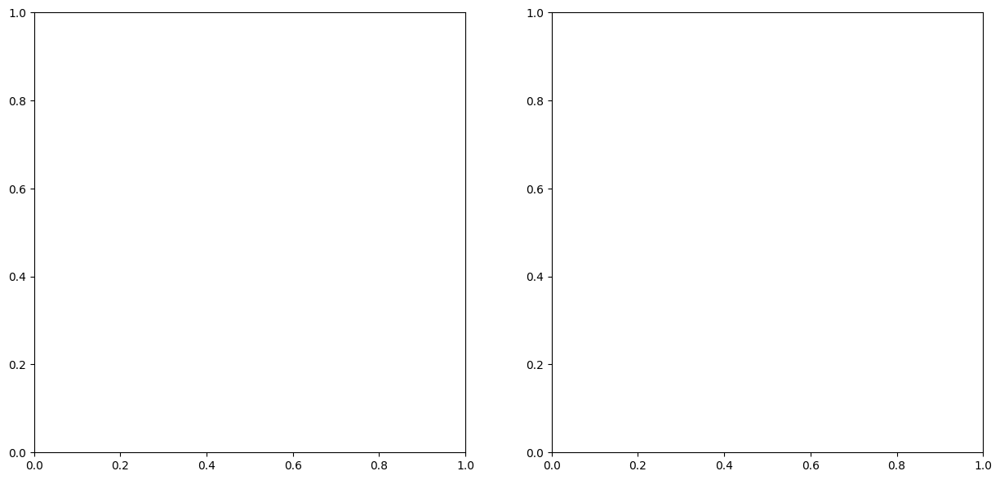

In [322]:
fig,ax=plt.subplots(1,2,figsize=(15,7))
directory = "../STMdata/20220811"
file = "Bias-Spectroscopy002.dat"
filePath=join(directory ,file)
#df_h=pd.read_csv(filePath,sep="\t",nrows=16)
#print(df_h[df_h.keys()]["Experiment"][15])
#df_d=pd.read_table(filePath,sep="\t",skiprows=16)
#print(df_d.keys())
#read_pointSpec(fig,ax,filePath,directory = "../STMdata/20220611",file = "001",offset=0,sigma=2)


filePath=filePath
 
Notfound=1
skiprows=10
while Notfound:
    df_h=pd.read_csv(filePath,sep="\t",nrows=skiprows)

    dic_key=df_h[df_h.keys()]["Experiment"][skiprows-1]
    print(dic_key)

    if dic_key!= "[DATA]":
        Notfound=1
        skiprows+=1
    else:
        Notfound=0

        df_h=pd.read_csv(filePath,sep="\t",nrows=skiprows)
print(df_h,skiprows)

skiprows=skiprows
Notfound=1
skiprows=19
while Notfound:

    df_d=pd.read_table(filePath,sep="\t",skiprows=skiprows)

    Keys=df_d.keys()

    if Keys[0]!= "Bias calc (V)":
        Notfound=1
        skiprows-=1
    else:
    #sts=df["LIY 1 omega (A)"]
        Notfound=0
        I=df_d[Keys[1]]
        X=np.array(df_d[Keys[0]])
print(df_d,skiprows)
                        

In [350]:
mydir,myFolder,fileName="../STMdata","20230223","SiC053.sxm"
filePath=join(mydir,myFolder,fileName)

SXMfile=pySPM.SXM(filePath)
header=SXMfile.header

Bias=header['BIAS'][0][0]
Curr=header['Z-CONTROLLER'][1][3]
Pos=header['SCAN_OFFSET'][0]
print(header.keys())
print(header.values())
#Key_value=[key_value for key_value in header.split(",")]

#print(Key_value)
key=",".join(header.keys())
value=",".join(["?"]*len(header))

"""""""""
CREATE TABLE STMimage(
   ID INTEGER,
   NANONIS_VERSION TEXT,
   CANIT_TYPE TEXT,
   TIME_STAMP  REAL，
   REC_DATE TEXT,
   REC_TIME TEXT,
   REC_TEMP REAL,
   ACQ_TIME REAL,
   SCAN_PIXELS INTEGER,
   SCAN_FILE TEXT,
   SCAN_TIME REAL,
   SCAN_RANGE REAL,
   SCAN_OFFSET TEXT,
   SCAN_ANGLE REAL,
   SCAN_DIR TEXT,
   BIAS REAL,
   Z_CONTROLLER TEXT,
   COMMENT TEXT,
   Session_Path TEXT,
   UI_Release TEXT,
   RT_Release TEXT,
   RT_Frequency TEXT,
   Signals_Oversampling TEXT,
   Animations_Period TEXT,
   Indicators_Period TEXT,
   Measurements_Period  TEXT,
   DATA_INFO TEXT,
   SCANIT_END TEXT,
   List_ID INTEGER,
   PRIMARY KEY (ID, List_ID),
  
   
 
   FOREIGN KEY (List_ID) 
      REFERENCES STMdataList (ID) 
         ON DELETE CASCADE 
         ON UPDATE NO ACTION

);



CREATE TABLE STMimageInfo(
   Info_ID INTEGER,
   List_ID INTEGER,
   TIME_STAMP  REAL,
   NANONIS_VERSION TEXT,
   SCANIT_TYPE TEXT,
   REC_DATE TEXT,
   REC_TIME TEXT,
   REC_TEMP TEXT,
   ACQ_TIME TEXT,
   SCAN_PIXELS TEXT,
   SCAN_FILE TEXT,
   SCAN_TIME TEXT,
   SCAN_RANGE TEXT,
   SCAN_OFFSET TEXT,
   SCAN_ANGLE TEXT,
   SCAN_DIR TEXT,
   BIAS TEXT,
   Z_CONTROLLER TEXT,
   COMMENT TEXT,
   Session_Path TEXT,
   UI_Release TEXT,
   RT_Release TEXT,
   RT_Frequency TEXT,
   Signals_Oversampling TEXT,
   Animations_Period TEXT,
   Indicators_Period TEXT,
   Measurements_Period  TEXT,
   DATA_INFO TEXT,
 
   
   PRIMARY KEY (Info_ID, List_ID),
  
   
 
   FOREIGN KEY (List_ID) 
      REFERENCES STMdataList (ID) 
         ON DELETE CASCADE 
         ON UPDATE NO ACTION

);



CREATE TABLE STMimageValue(
  Data_ID INTEGER,
  Info_ID INTEGER,
   List_ID INTEGER,
   TIME_STAMP  REAL,
   Z_forward   BLOB,
   Z_backward   BLOB,
   Output_8_forward   BLOB,
   Output_8_backward   BLOB,
   Internal_1_forward   BLOB,
   Internal_1_backward   BLOB,
   Internal_2_forward   BLOB,
   Internal_2_backward   BLOB,
   Internal_3_forward   BLOB,
   Internal_3_backward   BLOB,
   Internal_4_forward   BLOB,
   Internal_4_backward   BLOB,
   LIX_1_omega_forward   BLOB,
   LIX_1_omega_backward   BLOB,
    LIY_1_omega_forward   BLOB,
   LIY_1_omega_backward   BLOB,
  
 
   
   PRIMARY KEY (Info_ID, List_ID,Data_ID),
  
   
 
   FOREIGN KEY (List_ID) 
      REFERENCES STMdataList (ID) 
         ON DELETE CASCADE 
         ON UPDATE NO ACTION
		 
		 
  FOREIGN KEY (Info_ID) 
      REFERENCES STMimageInfo(Info_ID) 
         ON DELETE CASCADE 
         ON UPDATE NO ACTION

);





"""""
create_STMimage="CREATE TABLE STMimage(ID INTEGER,List_ID INTEGER,PRIMARY KEY (ID, List_ID),FOREIGN KEY (List_ID) REFERENCES STMdataList (ID) ON DELETE CASCADE ON UPDATE NO ACTION {})".format(key)
print(create_STMimage)

dict_keys(['NANONIS_VERSION', 'SCANIT_TYPE', 'REC_DATE', 'REC_TIME', 'REC_TEMP', 'ACQ_TIME', 'SCAN_PIXELS', 'SCAN_FILE', 'SCAN_TIME', 'SCAN_RANGE', 'SCAN_OFFSET', 'SCAN_ANGLE', 'SCAN_DIR', 'BIAS', 'Z-CONTROLLER', 'COMMENT', 'NanonisMain>Session Path', 'NanonisMain>SW Version', 'NanonisMain>UI Release', 'NanonisMain>RT Release', 'NanonisMain>RT Frequency (Hz)', 'NanonisMain>Signals Oversampling', 'NanonisMain>Animations Period (s)', 'NanonisMain>Indicators Period (s)', 'NanonisMain>Measurements Period (s)', 'DATA_INFO', 'SCANIT_END'])
dict_values([[['2']], [['FLOAT', 'MSBFIRST']], [['30.03.2023']], [['14:07:57']], [['290.0000000000']], [['998.3']], [['512', '512']], [['C:\\STM', 'data\\20230223\\SiC053.sxm']], [['9.728E-1', '9.728E-1']], [['2.000000E-8', '2.000000E-8']], [['3.252694E-7', '-1.266192E-7']], [['0.000E+0']], [['down']], [['-2.500E+0']], [['Name', 'on', 'Setpoint', 'P-gain', 'I-gain', 'T-const'], ['log', 'Current', '1', '3.000E-11', 'A', '2.500E-11', 'm', '2.000E-8', 'm/s', 

In [36]:
STMdate={"ID":1,"Name":"SiC001","CANIT_TYPE":"","UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}
STMimage={"ID":1,"List_ID":1,"TIME_STAMP":100,"NANONIS_VERSION":"SiC001","SCANIT_TYPE":"","REC_DATE":"","REC_TIME":"","REC_TEMP":"290","ACQ_TIME":"20.0","SCAN_PIXELS":"512","SCAN_FILE":"","SCAN_TIME":"30.0","SCAN_RANGE":"20","SCAN_OFFSET":"","SCAN_ANGLE":"10.0","SCAN_DIR":'up',"Time":'09:09:29',"BIAS": "2.5","Z_CONTROLLER": "","COMMENT":"SXM","Session Path":"","UI_Release":"","RT_Release":"","RT_Frequency":"","Signals_Oversampling":"","Animations_Period":"","Indicators_Period":"","Measurements_Period":"","DATA_INFO":""}

STMimageInfo={"Info_ID":1,"List_ID":1,"TIME_STAMP":100,"NANONIS_VERSION":"SiC001","SCANIT_TYPE":"","REC_DATE":"","REC_TIME":"","REC_TEMP":"290","ACQ_TIME":"20.0","SCAN_PIXELS":"512","SCAN_FILE":"","SCAN_TIME":"30.0","SCAN_RANGE":"20","SCAN_OFFSET":"","SCAN_ANGLE":"10.0","SCAN_DIR":'up',"BIAS": "2.5","Z_CONTROLLER": "","COMMENT":"SXM","Session_Path":"","UI_Release":"","RT_Release":"","RT_Frequency":"","Signals_Oversampling":"","Animations_Period":"","Indicators_Period":"","Measurements_Period":"","DATA_INFO":""}
database = "STMdata.db"
mydir,myFolder,fileName="../STMdata","20230223","SiC053.sxm"
filePath=join(mydir,myFolder,fileName)
#SELECT ID,TimeStamp FROM STMdataList WHERE UpdateFilePath="../STMdata/20230223/SiC053.sxm"
select_list_id="SELECT ID FROM STMdataList WHERE UpdateFilePath='{}'".format(filePath)
select_time_stamp="SELECT TimeStamp FROM STMdataList WHERE UpdateFilePath='{}'".format(filePath)
#print(select_list_id)
with sqlite3.connect(database) as conn:
        c = conn.cursor()
        #c.close()
        #c.execute(drop_project_table)
        data=c.execute(select_list_id)
        STMListID=data.fetchall()[0][0]
        data=c.execute(select_time_stamp)
        #data=c.execute(fect)
        
        Time_stamp=data.fetchall()[0][0]
SXMfile=pySPM.SXM(filePath)
header=SXMfile.header
#print("header is",header)
Bias=header['BIAS'][0][0]
Curr=header['Z-CONTROLLER'][1][3]
Pos=header['SCAN_OFFSET'][0]
STMimageInfo["Info_ID"]=1
STMimageInfo["List_ID"]=STMListID
STMimageInfo["TIME_STAMP"]=Time_stamp
imagekeys=STMimageInfo.keys()
imagekeys=list(imagekeys)
raws=""
cols=""
for i,value in enumerate(list(header.values())[:]):
    raws=""
    #print(len(values))
    for raw in value:
        cols=""
        for col in raw:
            if cols!="":
                cols=cols+" "+col
            else:
                cols=col
        if raws!="":
            raws=raws+' '+cols
        else:
            raws=cols
        
            
        
    try:
        STMimageInfo[imagekeys[i+3]]=raws
    except:
        pass
#STMimage[imagekeys[-1]]=1
#print(header.keys())
#print(header.values())
key=",".join(STMimageInfo.keys())
value=",".join(["?"]*len(STMimageInfo))
insert="INSERT INTO STMimageInfo({}) VALUES({}),".format(key,value)

print(insert,tuple(STMimageInfo.values()))
#print(STMimageInfo)
#insert="INSERT INTO STMdataList({}) VALUES({})".format(key,value)
#print(insert,tuple(STMimageInfo.values())) 
with sqlite3.connect(database) as conn:
    c = conn.cursor()
    #c.execute(drop_project_table)
    #c.execute(sql_create_projects_table)
    c.execute(insert,tuple(STMimageInfo.values()))


INSERT INTO STMimageInfo(Info_ID,List_ID,TIME_STAMP,NANONIS_VERSION,SCANIT_TYPE,REC_DATE,REC_TIME,REC_TEMP,ACQ_TIME,SCAN_PIXELS,SCAN_FILE,SCAN_TIME,SCAN_RANGE,SCAN_OFFSET,SCAN_ANGLE,SCAN_DIR,BIAS,Z_CONTROLLER,COMMENT,Session_Path,UI_Release,RT_Release,RT_Frequency,Signals_Oversampling,Animations_Period,Indicators_Period,Measurements_Period,DATA_INFO) VALUES(?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?,?), (1, 6180, 1680145677.0, '2', 'FLOAT MSBFIRST', '30.03.2023', '14:07:57', '290.0000000000', '998.3', '512 512', 'C:\\STM data\\20230223\\SiC053.sxm', '9.728E-1 9.728E-1', '2.000000E-8 2.000000E-8', '3.252694E-7 -1.266192E-7', '0.000E+0', 'down', '-2.500E+0', 'Name on Setpoint P-gain I-gain T-const log Current 1 3.000E-11 A 2.500E-11 m 2.000E-8 m/s 1.250E-3 s', '800.0n', 'C:\\STM data\\20230223', 'Generic 4', '11412', '8987', '10E+3', '10', '20E-3', '300E-3', '500E-3')


OperationalError: incomplete input

In [407]:
select_list_id="SELECT ID FROM STMdataLists"
with sqlite3.connect(database) as conn:
        c = conn.cursor()
        #c.close()
        c.execute(drop_project_table)
        c.execute(sql_create_projects_table)
        #c.execute(insert_sql)
        data=c.execute(fect)
        #print(data.fetchone())

OperationalError: database is locked

In [25]:
select_list_id="SELECT ID FROM STMdataList WHERE UpdateFilePath='{}'".format(filePath)
select_time_stamp="SELECT TimeStamp FROM STMdataList WHERE UpdateFilePath='{}'".format(filePath)
#print(select_list_id)
with sqlite3.connect(database) as conn:
        c = conn.cursor()
        #c.close()
        #c.execute(drop_project_table)
        data=c.execute(select_list_id)
        STMListID=data.fetchall()[0]
        data=c.execute(select_time_stamp)
        #data=c.execute(fect)
        
        Time_stamp=data.fetchall()[0][0]
        print(Time_stamp)

1680145677.0


In [334]:
# Example usage:
date_s="08.06.2022"
time_s="21:00:13"
date_time_s=date_s+" "+time_s
print(date_time_s)
date_string = "2022-06-08 21:00:13"
format_string='%d.%m.%Y %H:%M:%S'
timestamp = string_to_timestamp(date_time_s,format_string)
timestamp2 = string_to_timestamp(date_string)
if timestamp is not None:
    print(f"Timestamp: {timestamp}")
    print(f"Timestamp2: {timestamp2}")

08.06.2022 21:00:13
Timestamp: 1654686013.0
Timestamp2: 1654686013.0


In [342]:
j=0
STMdate={"ID":1,"Name":"SiC001","RecFilePath":"","UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}
filePath="../STMdata/20221116/Grid Spectroscopy001.3ds"
myfile=filePath
file=[f for f in filePath.split(".")]
filetype=file[-1]
fileName=[f for f in file[-2].split("/")][-1]
#print(filetype)
#STMdate["Name"]=fileName
#print(fileName)

grid = nap.read.Grid(filePath) 
sweep=grid._derive_sweep_signal()
dic_keys = grid._load_data().keys()
list_data=list(grid._load_data())
print(len(list_data))
print(list_data[2])
print(dic_keys)
omegaYArray = grid._load_data()[list_data[-1]]
params=grid._load_data()['params']
head = grid.read_raw_header(byte_offset=745)

df=pd.DataFrame([x.split(",") for x in head.split("\r\n")])
print(df)
#print(df[0][0],df[0][1],df[0][8])
Res=[j for j in df[0][0].split("=")]
Set=[j for j in df[0][1].split(";")]
Point=[j for j in df[0][8].split("=")]
Date=[j for j in df[0][12].split("=")]
DateTime=[j for j in Date[1].split(" ")]
#print(DateTime[0])
Recdate=DateTime[0][1:]
Rectime=DateTime[1][:-1]
#print("---------")
#print(Recdate)
#print("---------")
#print(Rectime)
Resxy=[j for j in Res[1].split("x")]
xpoints=[j for j in Set[0].split("=")]

Resoltion=[float(Resxy[0][1:]),float(Resxy[1][:-1]),float(Point[1])]
position=[float(xpoints[1]),float(Set[1])]
size=[float(Set[2]),float(Set[3])]
#print(Resoltion,position,size)

STMdate["ID"]=count+j
STMdate["Name"]=fileName
STMdate["RecFilePath"]=myfile
STMdate["UpdateFilePath"]=myfile
STMdate["Date"]=Recdate
STMdate["Time"]=Rectime
STMdate["Bias_V"]=round(float(0),2)
STMdate["Current_pA"]=round(float(0)*1e12,1)
STMdate["Type"]=filetype
STMdate["PosX_nm"]=round(float(position[0])*1e9,3)
STMdate["PosY_nm"]=round(float(position[1])*1e9,3)
print(STMdate)


4
LIX 1 omega (A)
dict_keys(['params', 'Current (A)', 'LIX 1 omega (A)', 'LIY 1 omega (A)'])
                                                    0
0                                Grid dim="128 x 128"
1   Grid settings=5.945114E-7;-5.126097E-7;1.00000...
2                                     Filetype=Linear
3                             Sweep Signal="Bias (V)"
4            Fixed parameters="Sweep Start;Sweep End"
5   Experiment parameters="X (m);Y (m);Z (m);Z off...
6                            # Parameters (4 byte)=14
7                        Experiment size (bytes)=1200
8                                          Points=100
9   Channels="Current (A);LIX 1 omega (A);LIY 1 om...
10             Delay before measuring (s)=0.000000E+0
11                     Experiment="Grid Spectroscopy"
12                   Start time="18.11.2022 15:37:06"
13                     End time="19.11.2022 02:40:44"
14                                              User=
15                                        C

In [341]:
mydir="../STMdata"
myFiledirs=[join(mydir,Fold) for Fold in os.listdir(mydir)]
myFiledirs.sort(key=os.path.getmtime)

filePathsA=[[],]
#print(myFiledirs)
for myFolder in myFiledirs[:-1]: 
    
    mypath=myFolder
    files=[f for f in os.listdir(mypath) if isfile(join(mypath,f))]
    filePaths=[join(mypath,file) for file in files]
    filePaths.sort(key=os.path.getmtime)  
#print(len(myFiledirs[:-1]))
drop_creat_new_table()
count=0
for mydir in myFiledirs[:-1]:
    myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
    myfiles.sort(key=os.path.getmtime)
    
    
    write_database_namelist(myfiles,count=count)
    length=len(myfiles)
    count=count+length

mydir="../STMdata/20230223"
myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
myfiles.sort(key=os.path.getmtime)
drop_creat_new_table()
print(len(myfiles))
write_database_namelist(myfiles,count=0)

In [285]:
mydir="../STMdata/20230223"
myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
myfiles.sort(key=os.path.getmtime)
drop_creat_new_table()
print(len(myfiles))
write_database_namelist(myfiles,count=0)


mydir,myFolder,fileName="../STMdata","20230223","SiC053.sxm"
filePath=join(mydir,myFolder,fileName)

SXMfile=pySPM.SXM(filePath)
header=SXMfile.header
STMimageData={"Data_ID":1,"Info_ID":1,"List_ID":1}
Bias=header['BIAS'][0][0]
Curr=header['Z-CONTROLLER'][1][3]
Pos=header['SCAN_OFFSET'][0]
print(Pos)

158


In [356]:
database = "STMdata.db"
fect="SELECT ID FROM STMdataList WHERE UpdateFilePath='../STMdata/20221116/SiC003.sxm'"
with sqlite3.connect(database) as conn:
    c = conn.cursor()
    data=c.execute(fect)
    #print(data.fetchall()[-1])
    count=data.fetchone()
    print(count[0])

3538


In [273]:
database = "STMdata.db"
drop_project_table="DROP TABLE IF EXISTS STMdataList"
sql_create_projects_table = """ CREATE TABLE IF NOT EXISTS STMdataList (
                                    ID   INTEGER PRIMARY KEY,
                                    Name TEXT NOT NULL,
                                    RecFilePath TEXT,
                                    UpdateFilePath TEXT,
                                    Date TEXT NOT NULL,
                                    Time TEXT NOT NULL,
                                    Bias_V REAL NOT NULL,
                                    Current_pA REAL NOT NULL,
                                    Type TEXT NOT NULL,
                                    PosX_nm  REAL NOT NULL, 
                                    PosY_nm REAL NOT NULL
                                ) """


drop_task_table="DROP TABLE IF EXISTS STMdata"
sql_create_tasks_table = """CREATE TABLE IF NOT EXISTS STMdata(
                                ID integer PRIMARY KEY,
                                Name text NOT NULL,
                                RecFilePath TEXT,
                                UpdateFilePath TEXT,
                                Date TEXT,
                                Time TEXT,
                                Type TEXT,
                                PosX_nm REAL, 
                                PosY_nm REAL,
                                STMdataList_ID integer FOREIGN KEY REFERENCES STMdataList.ID,
                                Data BLOB
                            );"""

insert_sql="INSERT INTO STMdataList (ID,Name,FilePath,Date,Time,Type,Bias_V,Current_pA,PosX_nm,PosY_nm) VALUES(1, 'SiC001', '../STMdata/20230201', '20230201', '12:00', 'SXMimage', 1.8, 30,230, 250 )"
print(insert_sql)
fect="SELECT * FROM STMdataList"


INSERT INTO STMdataList (ID,Name,FilePath,Date,Time,Type,Bias_V,Current_pA,PosX_nm,PosY_nm) VALUES(1, 'SiC001', '../STMdata/20230201', '20230201', '12:00', 'SXMimage', 1.8, 30,230, 250 )


In [274]:
with sqlite3.connect(database) as conn:
    c = conn.cursor()
    #c.close()
    c.execute(drop_project_table)
    c.execute(sql_create_projects_table)
    #c.execute(insert_sql)
    data=c.execute(fect)
    print(data.fetchone())
    
    

None


In [275]:
mydir="../STMdata/20230223"
myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
myfiles.sort(key=os.path.getmtime)
print(myfiles[55])

filePath=myfiles[55]
df_h=pd.read_csv(filePath,sep="\t",nrows=15)
print(df_h)
file=[f for f in filePath.split(".")]
filetype=file[-1]
fileName=[f for f in file[-2].split("/")][-1]
print(filetype)
STMdate["Name"]=fileName
print(fileName)
STMdate["UpdateFilePath"]=myfile
STMdate["ID"]=j
x=df_h["bias spectroscopy"][2]
y=df_h["bias spectroscopy"][3]
z=df_h["bias spectroscopy"][4]
date=df_h["bias spectroscopy"][0]
[d,t]=[d for d in date.split(" ")]
STMdate["Date"]=d
STMdate["Time"]=t
STMdate["Type"]=filetype
STMdate["PosX_nm"]=round(float(x)*1e9,3)
STMdate["PosY_nm"]=round(float(y)*1e9,3)

df=pd.read_table(filePath,sep="\t",skiprows=17)
sts=df["LIY 1 omega (A)"]
I=df["Current (A)"]
X=np.array(df["Bias calc (V)"])
Y=sts_filtered*1e12+offset
Bias=X[0]
Curr=I[0]
STMdate["Bias_V"]=round(float(Bias),2)
STMdate["Current_pA"]=round(float(Curr)*1e12,1)


../STMdata/20230223/Bias-Spectroscopy001.dat
              Experiment    bias spectroscopy  Unnamed: 2
0                   Date  30.03.2023 15:13:45         NaN
1                   User                  NaN         NaN
2                  X (m)           322.748E-9         NaN
3                  Y (m)          -127.795E-9         NaN
4                  Z (m)          -155.851E-9         NaN
5           Z offset (m)                 0E+0         NaN
6      Settling time (s)                 4E-3         NaN
7   Integration time (s)                 8E-3         NaN
8            Z-Ctrl hold                 TRUE         NaN
9            Final Z (m)          -155.857E-9         NaN
10           Filter type                  NaN         NaN
11                 Order                  NaN         NaN
12            Cutoff frq                  NaN         NaN
13             Comment01        ON THE island         NaN
14                [DATA]                  NaN         NaN
dat
Bias-Spectroscopy001


NameError: name 'sts_filtered' is not defined

In [17]:
mydir="../STMdata"
myFiledirs=[join(mydir,Fold) for Fold in os.listdir(mydir)]
myFiledirs.sort(key=os.path.getmtime)

filePathsA=[[],]
print(myFiledirs)
for myFolder in myFiledirs[:-1]: 
    
    mypath=myFolder
    files=[f for f in os.listdir(mypath) if isfile(join(mypath,f))]
    filePaths=[join(mypath,file) for file in files]
    filePaths.sort(key=os.path.getmtime)  
print(len(myFiledirs[:-1]))
for mydir in myFiledirs[:-1]:
    myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
    myfiles.sort(key=os.path.getmtime)

['../STMdata/20220608', '../STMdata/20220609', '../STMdata/20220611', '../STMdata/20220614', '../STMdata/20220615', '../STMdata/20220620', '../STMdata/20220621', '../STMdata/20220622', '../STMdata/20220623', '../STMdata/20220627', '../STMdata/20220628', '../STMdata/20220629', '../STMdata/20220630', '../STMdata/20220701', '../STMdata/20220704', '../STMdata/20220705', '../STMdata/20220706', '../STMdata/20220707', '../STMdata/20220708', '../STMdata/20220709', '../STMdata/20220711', '../STMdata/20220712', '../STMdata/20220713', '../STMdata/20220715', '../STMdata/20220717', '../STMdata/20220718', '../STMdata/20220719', '../STMdata/20220720', '../STMdata/20220725', '../STMdata/20220726', '../STMdata/20220727', '../STMdata/20220731', '../STMdata/20220801', '../STMdata/20220803', '../STMdata/20220805', '../STMdata/20220808', '../STMdata/20220810', '../STMdata/20220811', '../STMdata/20220812', '../STMdata/20220815', '../STMdata/20220816', '../STMdata/20220817', '../STMdata/20220818', '../STMdat

In [9]:
mydir="../STMdata/20230223"
myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
myfiles.sort(key=os.path.getmtime)
print(myfiles[56])

filePath=myfiles[56]
file=[f for f in filePath.split(".")]
filetype=file[-1]
fileName=[f for f in file[-2].split("/")][-1]
print(filetype)
STMdate["Name"]=fileName
print(fileName)

grid = nap.read.Grid(filePath) 
sweep=grid._derive_sweep_signal()
omegaYArray = grid._load_data()['LIY 1 omega (A)']
params=grid._load_data()['params']
head = grid.read_raw_header(byte_offset=745)
df=pd.DataFrame([x.split(",") for x in head.split("\r\n")])
print(df)
#print(df[0][0],df[0][1],df[0][8])
Res=[j for j in df[0][0].split("=")]
Set=[j for j in df[0][1].split(";")]
Point=[j for j in df[0][8].split("=")]
Date=[j for j in df[0][12].split("=")]
DateTime=[j for j in Date[1].split(" ")]
print(DateTime[0])
Recdate=DateTime[0][1:]
Rectime=DateTime[1][:-1]
print("---------")
print(Recdate)
print("---------")
print(Rectime)
Resxy=[j for j in Res[1].split("x")]
xpoints=[j for j in Set[0].split("=")]


file=[f for f in filePath.split(".")]
filetype=file[1]

fileData=[f for f in file[0].split("\\")]
fileName=fileData[-1]

Resoltion=[float(Resxy[0][1:]),float(Resxy[1][:-1]),float(Point[1])]
position=[float(xpoints[1]),float(Set[1])]
size=[float(Set[2]),float(Set[3])]
print(Resoltion,position,size)





../STMdata/20230223/Grid Spectroscopy002.3ds
3ds


NameError: name 'STMdate' is not defined

In [10]:
myfile=myfiles[0]
SXMfile=pySPM.SXM(myfile)
Bias,Curr,Pos,x_n=read_file_para(myfile)
Z_image=SXMfile.get_channel('Z')
Z_image.correct_median_diff()
Z_image.correct_lines()
image=Z_image.pixels
y_n=x_n
y_p,x_p=image.shape[1],image.shape[0]
X=np.linspace(float(Pos[0])*1e9,float(Pos[0])*1e9+float(x_n)*1e9,int(x_p))
Y=np.linspace(float(Pos[1])*1e9,float(Pos[1])*1e9+float(y_n)*1e9,int(y_p))
extent=[X[0],X[-1],Y[0],Y[-1]]

{'NANONIS_VERSION': [['2']], 'SCANIT_TYPE': [['FLOAT', 'MSBFIRST']], 'REC_DATE': [['24.02.2023']], 'REC_TIME': [['09:09:29']], 'REC_TEMP': [['290.0000000000']], 'ACQ_TIME': [['472.3']], 'SCAN_PIXELS': [['512', '512']], 'SCAN_FILE': [['C:\\STM', 'data\\20230223\\SiC001.sxm']], 'SCAN_TIME': [['4.608E-1', '4.608E-1']], 'SCAN_RANGE': [['5.000000E-8', '5.000000E-8']], 'SCAN_OFFSET': [['3.598358E-7', '1.644977E-7']], 'SCAN_ANGLE': [['0.000E+0']], 'SCAN_DIR': [['down']], 'BIAS': [['-2.500E+0']], 'Z-CONTROLLER': [['Name', 'on', 'Setpoint', 'P-gain', 'I-gain', 'T-const'], ['log', 'Current', '1', '3.000E-11', 'A', '3.500E-11', 'm', '2.500E-8', 'm/s', '1.400E-3', 's']], 'COMMENT': [['800.0n']], 'NanonisMain>Session Path': [['C:\\STM', 'data\\20230223']], 'NanonisMain>SW Version': [['Generic', '4']], 'NanonisMain>UI Release': [['11412']], 'NanonisMain>RT Release': [['8987']], 'NanonisMain>RT Frequency (Hz)': [['10E+3']], 'NanonisMain>Signals Oversampling': [['10']], 'NanonisMain>Animations Period 

In [11]:
print(Bias,Curr,Pos,x_n)

-2.500E+0 3.000E-11 ['3.598358E-7', '1.644977E-7'] 5.000000E-8


In [12]:
filePath=myfile
SXMfile=pySPM.SXM(filePath)
header=SXMfile.header
print(header.keys())
[x_n,y_n]=header['SCAN_RANGE'][0]
Bias=header['BIAS'][0][0]
Curr=header['Z-CONTROLLER'][1][3]
Pos=header['SCAN_OFFSET'][0]
FilePath=header['SCAN_FILE'][0][0]+header['SCAN_FILE'][0][1]
REC_Data=header['REC_DATE'][0][0]
REC_Time=header['REC_TIME'][0][0]

print(FilePath,REC_Data,REC_Time)
file=[f for f in FilePath.split(".")]
filetype=file[1]

fileData=[f for f in file[0].split("\\")]
fileName=fileData[-1]
print(fileName)
print(fileData)
print(filetype)
print(file)
print(float(Bias),float(Curr)*1e12,round(float(Pos[0])*1e9,3),round(float(Pos[1])*1e9,3))

dict_keys(['NANONIS_VERSION', 'SCANIT_TYPE', 'REC_DATE', 'REC_TIME', 'REC_TEMP', 'ACQ_TIME', 'SCAN_PIXELS', 'SCAN_FILE', 'SCAN_TIME', 'SCAN_RANGE', 'SCAN_OFFSET', 'SCAN_ANGLE', 'SCAN_DIR', 'BIAS', 'Z-CONTROLLER', 'COMMENT', 'NanonisMain>Session Path', 'NanonisMain>SW Version', 'NanonisMain>UI Release', 'NanonisMain>RT Release', 'NanonisMain>RT Frequency (Hz)', 'NanonisMain>Signals Oversampling', 'NanonisMain>Animations Period (s)', 'NanonisMain>Indicators Period (s)', 'NanonisMain>Measurements Period (s)', 'DATA_INFO', 'SCANIT_END'])
C:\STMdata\20230223\SiC001.sxm 24.02.2023 09:09:29
SiC001
['C:', 'STMdata', '20230223', 'SiC001']
sxm
['C:\\STMdata\\20230223\\SiC001', 'sxm']
-2.5 30.0 359.836 164.498


In [16]:
mydir="../STMdata/20230223"
myfiles=[join(mydir,Fold) for Fold in os.listdir(mydir)]
myfiles.sort(key=os.path.getmtime)
STMdata=[]
STMdate={"ID":1,"Name":"SiC001","RecFilePath":"","UpdateFilePath":"","Date":'24.02.2023',"Time":'09:09:29',"Bias_V": 2.5,"Current_pA": 30,"Type":"SXM","PosX_nm":328,"PosY_nm":328}
count=0
format_string='%d.%m.%Y %H:%M:%S'
for j, myfile in enumerate(myfiles):
    count=count+j
    try:
        if myfile.endswith(".sxm"):
            SXMfile=pySPM.SXM(myfile)
            header=SXMfile.header
            [x_n,y_n]=header['SCAN_RANGE'][0]
            Bias=header['BIAS'][0][0]
            Curr=header['Z-CONTROLLER'][1][3]
            Pos=header['SCAN_OFFSET'][0]
            FilePath=header['SCAN_FILE'][0][0]+header['SCAN_FILE'][0][1]
            REC_Data=header['REC_DATE'][0][0]
            REC_Time=header['REC_TIME'][0][0]
            file=[f for f in FilePath.split(".")]
            filetype=file[1]
            fileData=[f for f in file[0].split("\\")]
            fileName=fileData[-1]
            #print(j)
            date_time_s=REC_Data+" "+REC_Time
            timestamp = string_to_timestamp(date_time_s,format_string)
            STMdate["ID"]=count
            STMdate["Name"]=fileName
            STMdate["RecFilePath"]=FilePath
            STMdate["UpdateFilePath"]=myfile
            STMdate["Date"]=REC_Data
            STMdate["Time"]=REC_Time
            STMdate["Bias_V"]=round(float(Bias),2)
            STMdate["Current_pA"]=round(float(Curr)*1e12,1)
            STMdate["Type"]=filetype
            STMdate["PosX_nm"]=round(float(Pos[0])*1e9,3)
            STMdate["PosY_nm"]=round(float(Pos[1])*1e9,3)
            key=",".join(STMdate.keys())
            value=",".join(["?"]*len(STMdate))
            insert="INSERT INTO STMdataList({}) VALUES({})".format(key,value)
            with sqlite3.connect(database) as conn:
                c = conn.cursor()
                #c.execute(drop_project_table)
                #c.execute(sql_create_projects_table)
                c.execute(insert,tuple(STMdate.values()))
                print(STMdate)
        if myfile.endswith(".dat"):  
            filePath=myfile
            df_h=pd.read_csv(filePath,sep="\t",nrows=15)

            file=[f for f in filePath.split(".")]
            filetype=file[-1]
            fileName=[f for f in file[-2].split("/")][-1]
            STMdate["Name"]=fileName
            STMdate["RecFilePath"]=myfile
            STMdate["UpdateFilePath"]=myfile
            STMdate["ID"]=count
            x=df_h["bias spectroscopy"][2]
            y=df_h["bias spectroscopy"][3]
            z=df_h["bias spectroscopy"][4]
            date=df_h["bias spectroscopy"][0]
            [d,t]=[d for d in date.split(" ")]
            STMdate["Date"]=d
            STMdate["Time"]=t
            STMdate["Type"]=filetype
            STMdate["PosX_nm"]=round(float(x)*1e9,3)
            STMdate["PosY_nm"]=round(float(y)*1e9,3)

            df=pd.read_table(filePath,sep="\t",skiprows=17)
            sts=df["LIY 1 omega (A)"]
            I=df["Current (A)"]
            X=np.array(df["Bias calc (V)"])
            #Y=sts_filtered*1e12+offset
            Bias=X[0]
            Curr=I[0]
            STMdate["Bias_V"]=round(float(Bias),2)
            STMdate["Current_pA"]=round(float(Curr)*1e12,1)
            with sqlite3.connect(database) as conn:
                c = conn.cursor()
                #c.execute(drop_project_table)
                #c.execute(sql_create_projects_table)
                c.execute(insert,tuple(STMdate.values()))
                print(STMdate)
        if myfile.endswith(".3ds"):
            filePath=myfile
            file=[f for f in filePath.split(".")]
            filetype=file[-1]
            fileName=[f for f in file[-2].split("/")][-1]
            #print(filetype)
            #STMdate["Name"]=fileName
            #print(fileName)

            grid = nap.read.Grid(filePath) 
            sweep=grid._derive_sweep_signal()
            omegaYArray = grid._load_data()['LIY 1 omega (A)']
            params=grid._load_data()['params']
            head = grid.read_raw_header(byte_offset=745)
            df=pd.DataFrame([x.split(",") for x in head.split("\r\n")])
            #print(df)
            #print(df[0][0],df[0][1],df[0][8])
            Res=[j for j in df[0][0].split("=")]
            Set=[j for j in df[0][1].split(";")]
            Point=[j for j in df[0][8].split("=")]
            Date=[j for j in df[0][12].split("=")]
            DateTime=[j for j in Date[1].split(" ")]
            #print(DateTime[0])
            Recdate=DateTime[0][1:]
            Rectime=DateTime[1][:-1]
            #print("---------")
            #print(Recdate)
            #print("---------")
            #print(Rectime)
            Resxy=[j for j in Res[1].split("x")]
            xpoints=[j for j in Set[0].split("=")]

            Resoltion=[float(Resxy[0][1:]),float(Resxy[1][:-1]),float(Point[1])]
            position=[float(xpoints[1]),float(Set[1])]
            size=[float(Set[2]),float(Set[3])]
            #print(Resoltion,position,size)

            STMdate["ID"]=count
            STMdate["Name"]=fileName
            STMdate["RecFilePath"]=myfile
            STMdate["UpdateFilePath"]=myfile
            STMdate["Date"]=Recdate
            STMdate["Time"]=Rectime
            STMdate["Bias_V"]=round(float(Bias),2)
            STMdate["Current_pA"]=round(float(Curr)*1e12,1)
            STMdate["Type"]=filetype
            STMdate["PosX_nm"]=round(float(position[0])*1e9,3)
            STMdate["PosY_nm"]=round(float(position[1])*1e9,3)
            with sqlite3.connect(database) as conn:
                c = conn.cursor()
                #c.execute(drop_project_table)
                #c.execute(sql_create_projects_table)
                c.execute(insert,tuple(STMdate.values()))
                print(STMdate)
    except:
          print("Erro",myfile)
    finally:
          c.close()
            
    

0
(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.2023', '09:09:29', -2.5, 30.0, 'sxm', 359.836, 164.498)
1
(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.2023', '09:09:29', -2.5, 30.0, 'sxm', 359.836, 164.498)
2
(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.2023', '09:09:29', -2.5, 30.0, 'sxm', 359.836, 164.498)
3
(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.2023', '09:09:29', -2.5, 30.0, 'sxm', 359.836, 164.498)
4
(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.2023', '09:09:29', -2.5, 30.0, 'sxm', 359.836, 164.498)
5
(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.2023', '09:09:29', -2.5, 30.0, 'sxm', 359.836, 164.498)
6
(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.2023',

(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.2023', '09:09:29', -2.5, 30.0, 'sxm', 359.836, 164.498)
93
(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.2023', '09:09:29', -2.5, 30.0, 'sxm', 359.836, 164.498)
94
(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.2023', '09:09:29', -2.5, 30.0, 'sxm', 359.836, 164.498)
95
(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.2023', '09:09:29', -2.5, 30.0, 'sxm', 359.836, 164.498)
96
(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.2023', '09:09:29', -2.5, 30.0, 'sxm', 359.836, 164.498)
97
(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.2023', '09:09:29', -2.5, 30.0, 'sxm', 359.836, 164.498)
98
(0, 'SiC001', 'C:\\STMdata\\20230223\\SiC001.sxm', '../STMdata/20230223/SiC001.sxm', '24.02.20

In [ ]:
"""""""""
CREATE TABLE STMimage(
   ID INTEGER,
    NANONIS_VERSION TEXT,
   CANIT_TYPE TEXT,
   TIME__STAMP  REAL，
   REC_DATE TEXT,
   REC_TIME TEXT,
   REC_TEMP REAL,
   ACQ_TIME REAL,
   SCAN_PIXELS INTEGER,
   SCAN_FILE TEXT,
   SCAN_TIME REAL,
   SCAN_RANGE REAL,
   SCAN_OFFSET TEXT,
   SCAN_ANGLE REAL,
   SCAN_DIR TEXT,
   BIAS REAL,
   Z_CONTROLLER TEXT,
   COMMENT TEXT,
   Session Path TEXT,
   UI_Release TEXT,
   RT_Release TEXT,
   RT_Frequency TEXT,
   Signals_Oversampling TEXT,
   Animations_Period TEXT,
   Indicators_Period TEXT,
   Measurements_Period  TEXT,
   DATA_INFO TEXT,
   SCANIT_END TEXT,
   List_ID INTEGER,
   PRIMARY KEY (ID, List_ID),
  
   
 
   FOREIGN KEY (List_ID) 
      REFERENCES STMdataList (ID) 
         ON DELETE CASCADE 
         ON UPDATE NO ACTION
		 
		 
);



"""